# FAOStat Dataset: Time Series

## Forecasting Food Supply in East Africa

![yfood_outlook_june23_pr_banner](https://github.com/Muramati/FAOStat-Dataset-Time-Series/assets/70520367/30563c28-b0dd-4a1f-ad03-4e45385f8d1b)

## Business Understanding 

### Overview

East African food production plays a crucial role in ensuring food security for its population. The country's agricultural sector employs a significant portion of the population and contributes to the national economy. The countries are known for their diverse agricultural activities, including crop cultivation, livestock rearing, and fisheries.

In recent years, strides have been made to improve food sufficiency through various initiatives, including promoting modern farming techniques. The efforts have led to increased agricultural productivity and improved crop yields. The Supply Chain Analytics Forecast aims to assist users in analyzing and predicting supply chain dynamics for selected countries, enabling better decision-making and planning in the field of supply chain management.

The project aims to provide insights into the supply chain dynamics of different countries, specifically focusing on metrics such as import quantity, export quantity, domestic supply quantity, and production. It can be used by governments, businesses, and other organizations to make informed decisions about the supply chain of agricultural commodities. The project willl also help users to identify potential shortages or surpluses of commodities, and to make plans to mitigate these risks. The forecast helps users to track the performance of the supply chain over time, and to identify areas where improvements can be made.

### Problem Statement

The current state of food production in East Africa poses challenges to ensuring sufficient food supply for the growing population. Despite efforts to improve agricultural productivity, factors such as climate change, unpredictable weather patterns, and limited access to resources continue to impact the ability to accurately forecast and meet the population's food needs.

There is a need for a reliable prediction model that can forecast food supply and food balances in East Africa to assess whether it will be sufficient to meet the population's requirements. Such a model would help policymakers, agricultural stakeholders, and government agencies make informed decisions regarding food security, resource allocation, and import/export planning.

By leveraging historical data, real-time information, and advanced analytical techniques, the model would provide valuable insights into future food supply levels, helping to identify potential shortfalls or surpluses.

The development of a prediction model would support proactive planning and decision-making processes, allowing stakeholders to take appropriate measures in advance to bridge any potential food supply gaps. It would aid in optimizing resource allocation, promoting sustainable farming practices, and implementing targeted interventions to ensure food sufficiency for East Africa's population.

Therefore, the problem at hand is the lack of a reliable prediction model that accurately forecasts food supply , which hinders the ability to determine whether it will be sufficient to meet the growing population's needs. Developing such a model would greatly contribute to enhancing food security, optimizing resource allocation, and ensuring the well-being of the region's population.

### Objectives

 #### the main objective 

1. To Forecast Food supply: The primary objective of the time series model is to develop and deploy model that accurately predict food supply levels in East  Africa. By analyzing historical data, current conditions, and relevant variables, the model aims to provide forecasts that reflect the expected output of crops, livestock, and other food sources.    
#### Specific objectives 

1. To Assess Food Sufficiency: The model seeks to determine whether the projected food supply will be sufficient to meet the needs of the population. It aims to assess the adequacy of food supply in order to identify potential shortfalls or surpluses.

2.To Inform Decision-Making: The model aims to provide valuable insights to policymakers, government agencies, and agricultural stakeholders. By offering reliable predictions, the model can inform decision-making processes related to resource allocation, import/export planning, and interventions to ensure food security.

3. To Optimize Resource Allocation: The model aims to optimize the allocation of resources by identifying times of potential food shortages or surpluses. This can help in planning for the future. 

4. To Enhance Food Security: Ultimately, the objective of the prediction model is to contribute to improving food security in East Africa. By accurately forecasting food production and assessing sufficiency, the model aims to support proactive measures that ensure a consistent and adequate food supply for the growing population.

These objectives collectively aim to provide valuable insights, aid decision-making processes, and contribute to long-term food security in East Africa.

### Success metrics  
- Root Mean Square Error (RMSE): RMSE calculates the square root of the average squared difference between the predicted values and the actual values. It gives an estimate of the model's prediction error, with lower values indicating better performance.


## Data Understanding

The data from this project comes from the FAOStas site.
[Food Balances](https://www.fao.org/faostat/en/#data/SCL)

The CSV has the following columns:

1. `Area Code (M49)`: This column represents the standard area codes used by the United Nations for statistical purposes. The codes are developed and maintained by the United Nations Statistics Division.

2. `Area`: This column contains the country name or area name corresponding to the data.

3. `Element Code`: The element code represents the entities or categories based on which the data is collected. It is a numerical code used to identify specific elements.

4. `Element`: This column provides a description or name for the entities or categories represented by the element code.

5. `Item Code (CPC)`: The item code refers to the Central Product Classification code assigned to a specific product or item. It is a standardized code used for classification purposes.

6. `Item`: This column contains the product or item classification name. It is based on the Central Product Classification (CPC) system promulgated by the United Nations Statistical Commission.

7. `Year`: This column represents the year when the data was collected or recorded. 1961-2020

8. `Unit`: The unit column specifies the measurement unit used for the corresponding item. It indicates the quantity or scale in which the data is measured (e.g., kilograms, tonnes, liters).

9. `Value`: This column provides the numerical value associated with a specific item, measured in the units specified in the "Unit" column. It represents the quantity or magnitude of the item for a given year and area.

10. `Flag`: The flag column describes how the values in the dataset were acquired by the FAO (Food and Agriculture Organization of the United Nations). The flag values indicate the data's source or quality.

11. `Flag Description`: This column provides additional information or descriptions related to the flags used in the dataset. The "E" flag represents estimated values, the "X" flag indicates figures from international organizations, and the "I" flag denotes imputed values.

In summary, the dataset contains food balance data from different countries or areas, including information about the area, element, item, year, measurement unit, value, and data quality flags. The dataset helps in understanding food consumption, production, and other related factors for various products and regions over time.

## Data Preparation

In [1]:
#importing necessary libraries
import pandas as pd
import numpy as np
import ydata_profiling as pandas_profiling

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")
 

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.pylab import rcParams
from statsmodels.tsa.stattools import adfuller
from matplotlib.dates import AutoDateLocator, ConciseDateFormatter 
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARMA
import pmdarima as pm
from pmdarima.arima import auto_arima
from pmdarima import model_selection
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima.arima import auto_arima
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
import pickle

In [2]:
#previewing the dataset
faoDf = pd.read_csv('FaoStat_EA.csv')
faoDf.head(10)

,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year,Unit,Value,Flag,Flag Description
0,108,Burundi,511,Total Population - Both sexes,F2501,Population,2014,1000 No,9844.30,X,Figure from international organizations
1,108,Burundi,511,Total Population - Both sexes,F2501,Population,2015,1000 No,10160.03,X,Figure from international organizations
2,108,Burundi,511,Total Population - Both sexes,F2501,Population,2016,1000 No,10488.00,X,Figure from international organizations
3,108,Burundi,511,Total Population - Both sexes,F2501,Population,2017,1000 No,10827.02,X,Figure from international organizations
4,108,Burundi,511,Total Population - Both sexes,F2501,Population,2018,1000 No,11175.37,X,Figure from international organizations
5,108,Burundi,511,Total Population - Both sexes,F2501,Population,2019,1000 No,11530.58,X,Figure from international organizations
6,108,Burundi,511,Total Population - Both sexes,F2501,Population,2020,1000 No,11890.78,X,Figure from international organizations
7,108,Burundi,5301,Domestic supply quantity,F2501,Population,2014,1000 t,0.00,I,Imputed value
8,108,Burundi,5301,Domestic supply quantity,F2501,Population,2015,1000 t,0.00,I,Imputed value
9,108,Burundi,5301,Domestic supply quantity,F2501,Population,2016,1000 t,0.00,I,Imputed value


In [3]:
#previewing the dataset
faoDf_EAC = pd.read_csv('Faostat EAC2.csv')
faoDf_EAC.head(5)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,FBSH,"Food Balances (-2013, old methodology and popu...",404,Kenya,511,Total Population - Both sexes,F2501,Population,1961,1961,1000 No,8361.0,X,Figure from international organizations
1,FBSH,"Food Balances (-2013, old methodology and popu...",404,Kenya,511,Total Population - Both sexes,F2501,Population,1962,1962,1000 No,8629.0,X,Figure from international organizations
2,FBSH,"Food Balances (-2013, old methodology and popu...",404,Kenya,511,Total Population - Both sexes,F2501,Population,1963,1963,1000 No,8908.0,X,Figure from international organizations
3,FBSH,"Food Balances (-2013, old methodology and popu...",404,Kenya,511,Total Population - Both sexes,F2501,Population,1964,1964,1000 No,9200.0,X,Figure from international organizations
4,FBSH,"Food Balances (-2013, old methodology and popu...",404,Kenya,511,Total Population - Both sexes,F2501,Population,1965,1965,1000 No,9505.0,X,Figure from international organizations


In [4]:
class DataUnderstanding:
    def __init__(self, df):
        self.df = df
    
    def get_summary_statistics(self):
        summary_stats = self.df.describe()
        return summary_stats
    
    def get_missing_values(self):
        missing_values = self.df.isnull().sum()
        return missing_values
    
    def get_info(self):
        info = self.df.info()
        return info
    
    def get_dtypes(self):
        dtypes = self.df.dtypes
        return dtypes
    
    def get_value_counts(self):
        value_counts = {}
        for column in self.df.columns:
            value_counts[column] = self.df[column].value_counts()
        return value_counts
    
    def convert_to_datetime(self, column):
        self.df[column] = pd.to_datetime(self.df[column])
    
    def set_index(self, column):
        self.df.set_index(column, inplace=True)
    
    def sort_data(self):
        self.df.sort_index(inplace=True)


In [5]:
# Initialize the DataUnderstanding class with your DataFrame 'df'
du = DataUnderstanding(faoDf)

In [6]:
# Initialize the DataUnderstanding class with your DataFrame 'df'
du_EAC = DataUnderstanding(faoDf_EAC)

In [7]:
# Get the summary statistics
summary_stats = du.get_summary_statistics()
print("Summary Statistics:")
summary_stats

Summary Statistics:


,Area Code (M49),Element Code,Year,Value
count,38257.000000,38257.000000,38257.000000,38257.000000
mean,537.488251,4700.796926,2015.273257,209.897015
std,270.925205,1734.143947,3.168741,2217.437940
min,108.000000,511.000000,2010.000000,-201.000000
25%,180.000000,5142.000000,2013.000000,0.000000
50%,646.000000,5301.000000,2015.000000,0.200000
75%,800.000000,5611.000000,2018.000000,15.000000
max,834.000000,5911.000000,2020.000000,89561.400000


In [8]:
# Get the summary statistics
summary_stats_EAC = du_EAC.get_summary_statistics()
print("Summary Statistics:")
summary_stats_EAC

Summary Statistics:


,Area Code (M49),Element Code,Year Code,Year,Value
count,100350.000000,100350.000000,100350.000000,100350.000000,100350.000000
mean,670.535127,4637.567015,1985.500000,1985.500000,115.232742
std,174.285262,1858.014087,14.430942,14.430942,998.727900
min,404.000000,511.000000,1961.000000,1961.000000,-72.000000
25%,404.000000,5142.000000,1973.000000,1973.000000,0.000000
50%,800.000000,5301.000000,1985.500000,1985.500000,0.100000
75%,834.000000,5611.000000,1998.000000,1998.000000,10.000000
max,834.000000,5911.000000,2010.000000,2010.000000,44973.000000


In [9]:
# Get the information about the DataFrame
info = du.get_info()
print("\nDataFrame Information:")
info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38257 entries, 0 to 38256
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Area Code (M49)   38257 non-null  int64  
 1   Area              38257 non-null  object 
 2   Element Code      38257 non-null  int64  
 3   Element           38257 non-null  object 
 4   Item Code (CPC)   38257 non-null  object 
 5   Item              38257 non-null  object 
 6   Year              38257 non-null  int64  
 7   Unit              38257 non-null  object 
 8   Value             38257 non-null  float64
 9   Flag              38257 non-null  object 
 10  Flag Description  38257 non-null  object 
dtypes: float64(1), int64(3), object(7)
memory usage: 3.2+ MB

DataFrame Information:


In [10]:
# Get the information about the DataFrame
info_EAC = du_EAC.get_info()
print("\nDataFrame Information:")
info_EAC

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100350 entries, 0 to 100349
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Domain Code       100350 non-null  object 
 1   Domain            100350 non-null  object 
 2   Area Code (M49)   100350 non-null  int64  
 3   Area              100350 non-null  object 
 4   Element Code      100350 non-null  int64  
 5   Element           100350 non-null  object 
 6   Item Code (CPC)   100350 non-null  object 
 7   Item              100350 non-null  object 
 8   Year Code         100350 non-null  int64  
 9   Year              100350 non-null  int64  
 10  Unit              100350 non-null  object 
 11  Value             100350 non-null  float64
 12  Flag              100350 non-null  object 
 13  Flag Description  100350 non-null  object 
dtypes: float64(1), int64(4), object(9)
memory usage: 10.7+ MB

DataFrame Information:


In [11]:
# Get the data types
dtypes = du.get_dtypes()
print("\nData Types:")
print(dtypes)



Data Types:
Area Code (M49)       int64
Area                 object
Element Code          int64
Element              object
Item Code (CPC)      object
Item                 object
Year                  int64
Unit                 object
Value               float64
Flag                 object
Flag Description     object
dtype: object


In [12]:
# Get the data types
dtypes_EAC = du_EAC.get_dtypes()
print("\nData Types:")
print(dtypes_EAC)



Data Types:
Domain Code          object
Domain               object
Area Code (M49)       int64
Area                 object
Element Code          int64
Element              object
Item Code (CPC)      object
Item                 object
Year Code             int64
Year                  int64
Unit                 object
Value               float64
Flag                 object
Flag Description     object
dtype: object


In [13]:
# Get the count of unique values for each column
value_counts = du.get_value_counts()
print("\nValue Counts:")
print(value_counts)


Value Counts:
{'Area Code (M49)': 834    7020
404    6962
800    6800
646    6508
180    6248
108    3724
728     995
Name: Area Code (M49), dtype: int64, 'Area': United Republic of Tanzania         7020
Kenya                               6962
Uganda                              6800
Rwanda                              6508
Democratic Republic of the Congo    6248
Burundi                             3724
South Sudan                          995
Name: Area, dtype: int64, 'Element Code': 5301    6165
5611    5862
5142    5773
645     5745
5170    5402
5911    4900
5511    4346
511       64
Name: Element Code, dtype: int64, 'Element': Domestic supply quantity               6165
Import Quantity                        5862
Food                                   5773
Food supply quantity (kg/capita/yr)    5745
Residuals                              5402
Export Quantity                        4900
Production                             4346
Total Population - Both sexes            64
Name: 

In [14]:
# Get the count of unique values for each column
value_counts_EAC = du_EAC.get_value_counts()
print("\nValue Counts:")
print(value_counts_EAC)


Value Counts:
{'Domain Code': FBSH    100350
Name: Domain Code, dtype: int64, 'Domain': Food Balances (-2013, old methodology and population)    100350
Name: Domain, dtype: int64, 'Area Code (M49)': 404    26700
834    26700
800    25350
646    21600
Name: Area Code (M49), dtype: int64, 'Area': Kenya                          26700
United Republic of Tanzania    26700
Uganda                         25350
Rwanda                         21600
Name: Area, dtype: int64, 'Element Code': 5301    18500
5611    17650
5142    17400
645     17400
5911    16400
5511    12800
511       200
Name: Element Code, dtype: int64, 'Element': Domestic supply quantity               18500
Import Quantity                        17650
Food                                   17400
Food supply quantity (kg/capita/yr)    17400
Export Quantity                        16400
Production                             12800
Total Population - Both sexes            200
Name: Element, dtype: int64, 'Item Code (CPC)': F2602  

In [15]:
# Get the count of missing values
missing_values = du.get_missing_values()
print("\nMissing Values:")
print(missing_values)


Missing Values:
Area Code (M49)     0
Area                0
Element Code        0
Element             0
Item Code (CPC)     0
Item                0
Year                0
Unit                0
Value               0
Flag                0
Flag Description    0
dtype: int64


There is no missing value

In [16]:
# Get the count of missing values
missing_values_EAC = du_EAC.get_missing_values()
print("\nMissing Values:")
print(missing_values_EAC)


Missing Values:
Domain Code         0
Domain              0
Area Code (M49)     0
Area                0
Element Code        0
Element             0
Item Code (CPC)     0
Item                0
Year Code           0
Year                0
Unit                0
Value               0
Flag                0
Flag Description    0
dtype: int64


There is no missing values

pivot both the dataframe so that the The 'Value' column values are spread across the new columns based on their corresponding 'Year' values.
This format allows for efficient data exploration, visualization, and further analysis.

In [17]:
df = faoDf.copy()

# Pivot the dataframe
pivot_df = df.pivot(index=['Area Code (M49)', 'Area', 'Element Code', 'Element', 'Item Code (CPC)', 'Item', 'Unit', 'Flag',
                          'Flag Description'],
                    columns='Year',
                    values='Value').reset_index()

In [18]:
pivot_df.head()

Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,108,Burundi,511,Total Population - Both sexes,F2501,Population,1000 No,X,Figure from international organizations,NaN,NaN,NaN,NaN,9844.30,10160.03,10488.00,10827.02,11175.37,11530.58,11890.78
1,108,Burundi,645,Food supply quantity (kg/capita/yr),F2511,Wheat and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,4.74,2.48,5.26,6.41,7.02,7.63,5.63
2,108,Burundi,645,Food supply quantity (kg/capita/yr),F2513,Barley and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,108,Burundi,645,Food supply quantity (kg/capita/yr),F2514,Maize and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,13.57,16.08,23.66,23.67,28.49,23.92,21.54
4,108,Burundi,645,Food supply quantity (kg/capita/yr),F2515,Rye and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,NaN,NaN


In [19]:
df_EAC = faoDf_EAC.copy()

# Pivot the dataframe
pivot_df_EAC = df_EAC.pivot(index=['Area Code (M49)', 'Area', 'Element Code', 'Element', 'Item Code (CPC)', 'Item', 'Unit', 'Flag',
                          'Flag Description'],
                    columns='Year',
                    values='Value').reset_index()

In [20]:
pivot_df_EAC.head()

Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,1961,...,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010
0,404,Kenya,511,Total Population - Both sexes,F2501,Population,1000 No,X,Figure from international organizations,8361.00,...,32126.00,33001.00,33905.00,34835.00,35786.00,36757.00,37752.00,38773.00,39825.00,40909.00
1,404,Kenya,645,Food supply quantity (kg/capita/yr),F2511,Wheat and products,kg,E,Estimated value,7.60,...,27.47,25.07,24.31,21.94,26.59,25.74,26.38,22.54,24.78,32.05
2,404,Kenya,645,Food supply quantity (kg/capita/yr),F2513,Barley and products,kg,E,Estimated value,0.03,...,0.04,0.04,0.05,0.08,0.06,0.03,0.04,0.04,0.06,0.29
3,404,Kenya,645,Food supply quantity (kg/capita/yr),F2514,Maize and products,kg,E,Estimated value,111.63,...,84.97,80.40,83.48,82.74,82.64,81.78,78.97,78.94,76.53,78.45
4,404,Kenya,645,Food supply quantity (kg/capita/yr),F2516,Oats,kg,E,Estimated value,0.38,...,0.11,0.06,0.07,0.07,0.06,0.13,0.07,0.12,0.08,0.05


#### pandas profiling Report

In [21]:
# # Generate a profile report using pandas_profiling

report = pandas_profiling.ProfileReport(pivot_df)

In [22]:
# Display the report as an interactive notebook iframe
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
# html
report.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Cleaning

In [24]:
#Checking for duplicates and missing data
def cleaning(pivot_df):
      # Check for missing data
    missing = pivot_df.isna().sum().sum()
      # Check for duplicated data
    duplicated = pivot_df.duplicated().sum()
    return (f"There are '{missing}' missing values and '{duplicated}' duplicated values in the dataset")

In [25]:
cleaning(pivot_df)

"There are '11067' missing values and '0' duplicated values in the dataset"

In [26]:
cleaning(pivot_df_EAC)

"There are '0' missing values and '0' duplicated values in the dataset"

In [27]:
# A function checking the percentage of the missing values
def missing_values_percentage(pivot_df):
    # Calculate the total number of missing values
    total_missing = pivot_df.isnull().sum().sum()

    # Calculate the total number of cells in the DataFrame
    total_cells = pivot_df.size

    # Calculate the percentage of missing values
    percentage_missing = (total_missing / total_cells) * 100

    return percentage_missing

missing_values_percentage(pivot_df)

12.340544157002677

In [28]:
# filling the missing values with 0
pivot_filled = pivot_df.fillna(0)

In [29]:
# call the function
cleaning(pivot_filled)

"There are '0' missing values and '0' duplicated values in the dataset"

#### Dealing with missing values
When dealing with missing values in a food balance sheet dataset, filling them with zeros can be a reasonable approach depending on 

1.Nature of the missing values: Food balance sheet datasets typically contain information about various food items, quantities, and production/consumption values. Missing values in the  datasets  arise due to different reasons, such as data collection limitations, reporting gaps, or incomplete records.

2.In our  case, missing values indicate that no data is available for a specific item or category.Considering countries like South Sudan  there was no data in the earlier years as it was just incorporated as a country of late 2019.

## EDA and VISUALIZATION

###  Univariate Analysis

Through this univariate analysis, we aim to identify the top 10 food products in East African countries based on production, consumption, or trade quantities. The analysis will provide valuable insights into the food landscape of the region , researchers, and us make informed decisions. The findings may contribute to understanding the food preferences, agricultural practices, and trade dynamics within East African countries

##### Top 10 Items produced in Eastern Africa

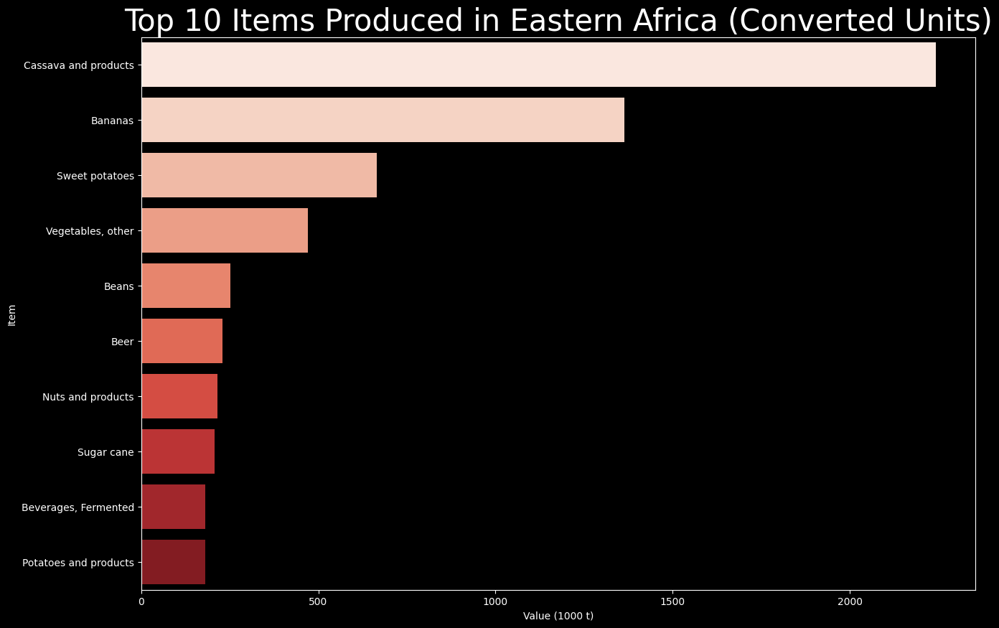

In [30]:
def convert_units(value, unit):
    if unit == '1000 t':
        return value * 1000  # Convert tonnes to kilograms
    else:
        return value

# Setting the style to be dark_background
plt.style.use("dark_background")

# Removing duplicate entries in the "Item" column
df_unique_items = df[df['Item'] != 'Population'].drop_duplicates(subset=['Item'])

# Grouping the data by item and summing the values for each year
year_columns = [str(year) for year in range(2010, 2021)]
pivot_dff = df_unique_items.pivot(index='Item', columns='Year', values='Value')

# Update the values in the existing DataFrame
items = pivot_dff.sum(axis=1).nlargest(10).reset_index()
items.columns = ['Item', 'Value']
items["Unit"] = df_unique_items.set_index("Item").loc[items["Item"], "Unit"]
items["Value"] = items.apply(lambda row: convert_units(row["Value"], row["Unit"]), axis=1)

# Plotting
plt.rcParams['figure.figsize'] = (15, 10)
sns.barplot(x=items.Value, y=items.Item, data=items, palette='Reds')
plt.title("Top 10 Items Produced in Eastern Africa (Converted Units)", fontsize=30)
plt.xlabel("Value (1000 t)")
plt.ylabel("Item")
plt.show()


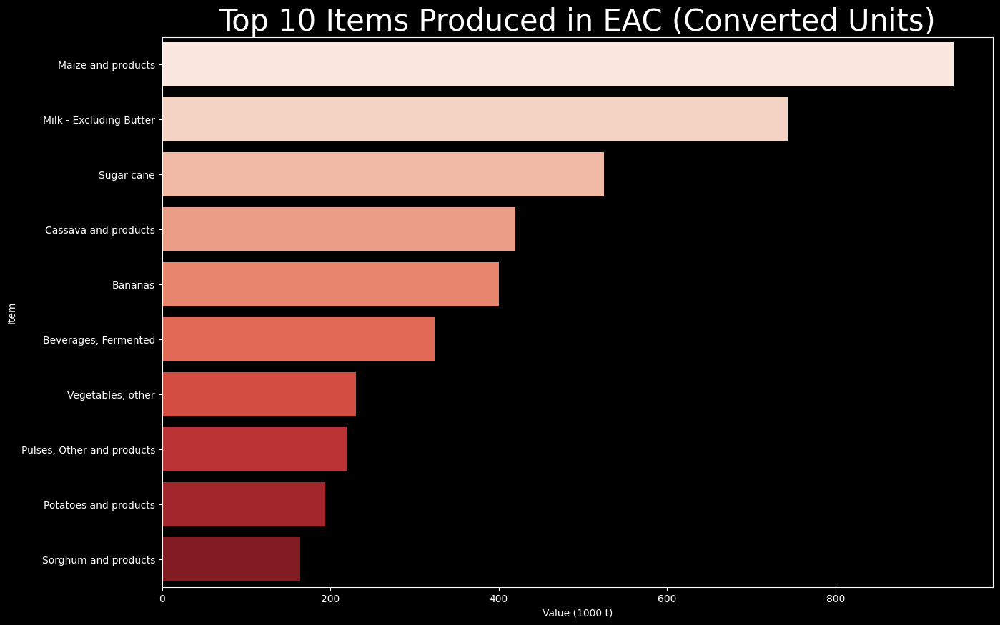

In [31]:
def convert_units(value, unit):
    if unit == 'tonnes':
        return value * 1000  # Convert tonnes to kilograms
    else:
        return value

# Setting the style to be dark_background
plt.style.use("dark_background")

# Removing duplicate entries in the "Item" column
df_unique_items_EAC = df_EAC[df_EAC['Item'] != 'Population'].drop_duplicates(subset=['Item'])

# Grouping the data by item and summing the values for each year
year_columns = [str(year) for year in range(2010, 2021)]
pivot_dff_EAC = df_unique_items_EAC.pivot(index='Item', columns='Year', values='Value')

# Update the values in the existing DataFrame
items = pivot_dff_EAC.sum(axis=1).nlargest(10).reset_index()
items.columns = ['Item', 'Value']
items["Unit"] = df_unique_items_EAC.set_index("Item").loc[items["Item"], "Unit"]
items["Value"] = items.apply(lambda row: convert_units(row["Value"], row["Unit"]), axis=1)

# Plotting
plt.rcParams['figure.figsize'] = (15, 10)
sns.barplot(x=items.Value, y=items.Item, data=items, palette='Reds')
plt.title("Top 10 Items Produced in EAC (Converted Units)", fontsize=30)
plt.xlabel("Value (1000 t)")
plt.ylabel("Item")
plt.show()


$ inference $
- After analyzing a visualization of the top 10 items produced by East African countries, we can observe distinct production patterns. Cassava and products emerges as the dominant product, closely followed by Bananas. Conversely, potatoes and associated products exhibit the lowest production levels among the selected items.

In [32]:
pivot_filled


Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,108,Burundi,511,Total Population - Both sexes,F2501,Population,1000 No,X,Figure from international organizations,0.0,0.0,0.0,0.0,9844.30,10160.03,10488.00,10827.02,11175.37,11530.58,11890.78
1,108,Burundi,645,Food supply quantity (kg/capita/yr),F2511,Wheat and products,kg,E,Estimated value,0.0,0.0,0.0,0.0,4.74,2.48,5.26,6.41,7.02,7.63,5.63
2,108,Burundi,645,Food supply quantity (kg/capita/yr),F2513,Barley and products,kg,E,Estimated value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,108,Burundi,645,Food supply quantity (kg/capita/yr),F2514,Maize and products,kg,E,Estimated value,0.0,0.0,0.0,0.0,13.57,16.08,23.66,23.67,28.49,23.92,21.54
4,108,Burundi,645,Food supply quantity (kg/capita/yr),F2515,Rye and products,kg,E,Estimated value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4479,834,United Republic of Tanzania,5911,Export Quantity,F2782,"Fish, Liver Oil",1000 t,E,Estimated value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4480,834,United Republic of Tanzania,5911,Export Quantity,F2782,"Fish, Liver Oil",1000 t,I,Imputed value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4481,834,United Republic of Tanzania,5911,Export Quantity,F2807,Rice and products,1000 t,I,Imputed value,75.0,54.0,27.0,79.0,107.00,23.00,19.00,1.00,46.00,171.00,527.00
4482,834,United Republic of Tanzania,5911,Export Quantity,F2848,Milk - Excluding Butter,1000 t,I,Imputed value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00


#### Top Products in Domestic Supply Quantity

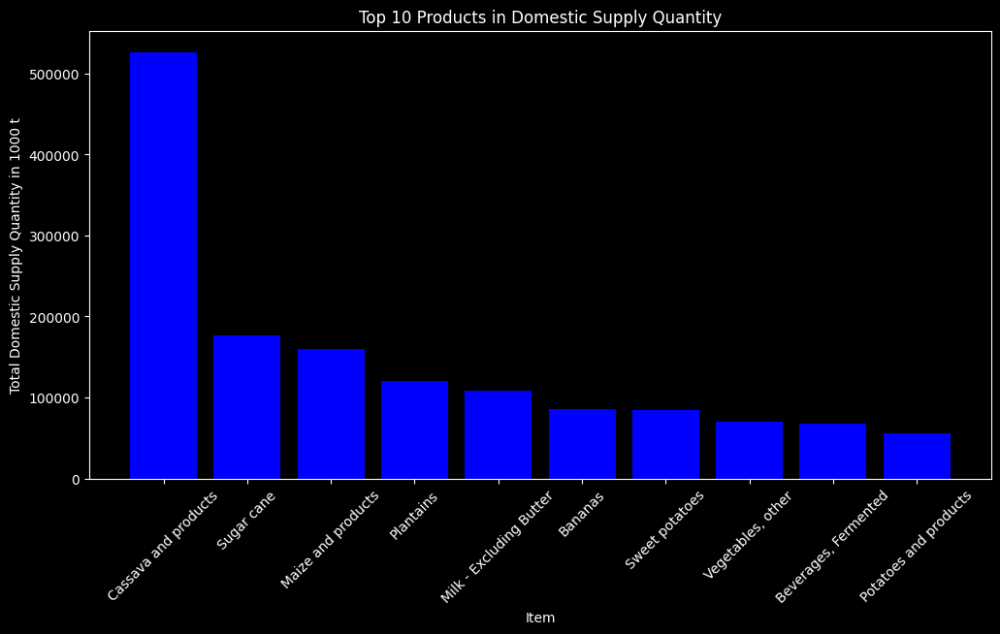

In [33]:
def plot_top_products_domestic_supply(pivot_df, num_products=10):
    # Filter the DataFrame to include only 'Domestic supply quantity' elements
    domestic_supply = pivot_df[pivot_df['Element'] == 'Domestic supply quantity']

    # Calculate the total domestic supply quantity for each item
    domestic_supply_sum = domestic_supply.groupby('Item')[[str(year) for year in range(2010, 2021)]].sum().sum(axis=1)

    # Select the top 'num_products' products with the highest total domestic supply quantity
    top_products = domestic_supply_sum.nlargest(num_products)

    # Plot the bar graph
    plt.figure(figsize=(12, 6))
    plt.bar(top_products.index, top_products.values, color='blue')
    plt.xlabel('Item')
    plt.ylabel('Total Domestic Supply Quantity in 1000 t')
    plt.title(f'Top {num_products} Products in Domestic Supply Quantity')
    plt.xticks(rotation=45)
    plt.show()
plot_top_products_domestic_supply(pivot_filled, num_products=10)    

$ inference $   
The Top  3 Products in Domestic Supply Quantity are    
- cassave and products
- Sugar cane
- Maize and products

### Bivariate Analysis

##### Import vs Export

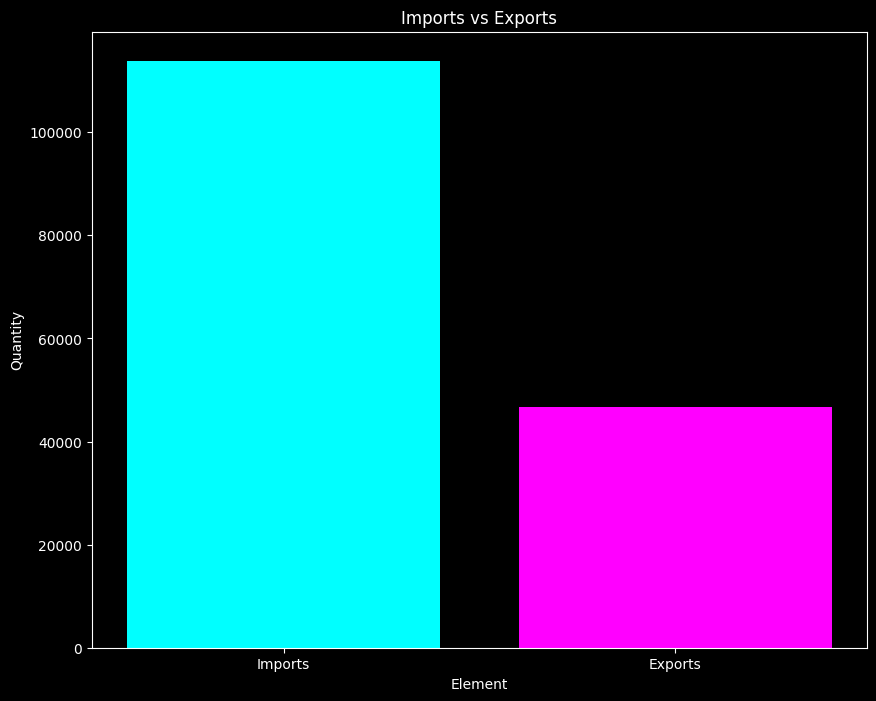

In [34]:
# Calculate the total Import Quantity and Export Quantity
import_quantity = pivot_filled[pivot_filled['Element'] == 'Import Quantity'][year_columns].sum().sum()
export_quantity = pivot_filled[pivot_filled['Element'] == 'Export Quantity'][year_columns].sum().sum()
# Create a bar graph
labels = ['Imports', 'Exports']
sizes = [import_quantity, export_quantity]
colors = ['cyan', 'magenta']
plt.rcParams['figure.figsize'] = (10, 8)
plt.bar(labels, sizes, color=colors)
plt.xlabel('Element')
plt.ylabel('Quantity')
plt.title('Imports vs Exports')
plt.show()



$ inference $   
- The bar graph represents the comparison between the import quantity and export quantity in the dataset. The x-axis shows the two elements: "Import Quantity" and "Export Quantity." The y-axis represents the corresponding quantities.

- The bars in the graph depict the quantities, with the cyan color indicating the import quantity and the magenta color indicating the export quantity.

- This graph provides a visual representation of the difference between the import and export quantities, allowing for easy comparison between the two elements.

#####  Domestic Supply Quantity vs Export Quantity    

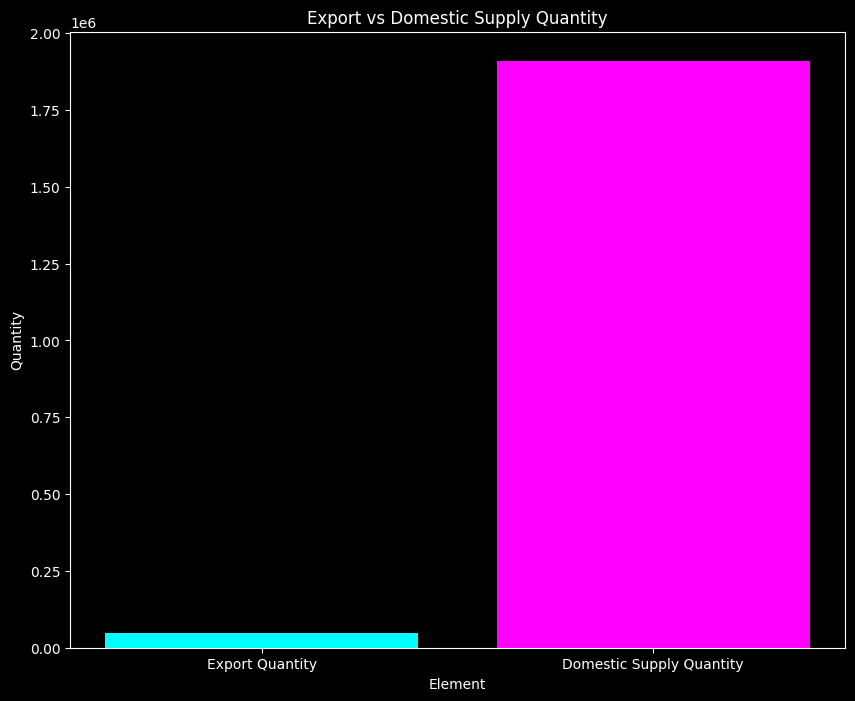

In [35]:
# Convert the year columns to string
year_columns = [str(year) for year in range(2010, 2021)]
# Calculate the total Import Quantity and Domestic Supply Quantity
export_quantity = pivot_filled[pivot_filled['Element'] == 'Export Quantity'][year_columns].sum().sum()
domestic_supply_quantity = pivot_filled[pivot_filled['Element'] == 'Domestic supply quantity'][year_columns].sum().sum()
# Create a bar graph
labels = ['Export Quantity', 'Domestic Supply Quantity']
sizes = [export_quantity, domestic_supply_quantity]
colors = ['cyan', 'magenta']
plt.rcParams['figure.figsize'] = (10, 8)
plt.bar(labels, sizes, color=colors)
plt.xlabel('Element')
plt.ylabel('Quantity')
plt.title('Export vs Domestic Supply Quantity')
plt.show()

$inference$    
 - This insight implies that East Africa focuses more on meeting its domestic food demand rather than exporting a significant portion of its food production.

#### Domestic Supply Quantity vs Import Quantity

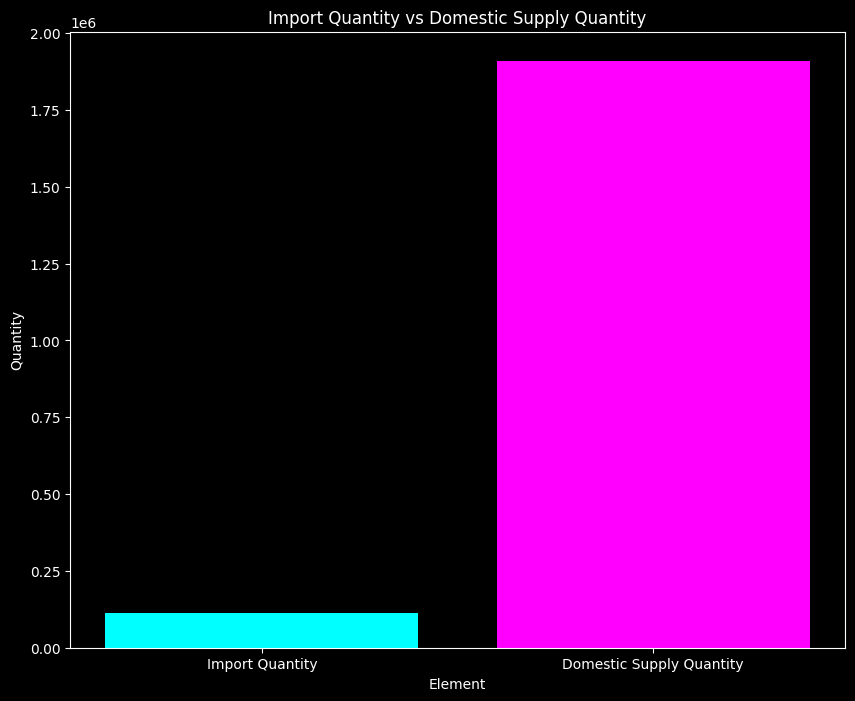

In [36]:

# Calculate the total Export Quantity and Domestic Supply Quantity
import_quantity = pivot_filled[pivot_filled['Element'] == 'Import Quantity'][year_columns].sum().sum()
domestic_supply_quantity = pivot_filled[pivot_filled['Element'] == 'Domestic supply quantity'][year_columns].sum().sum()
# Create a bar graph
labels = ['Import Quantity', 'Domestic Supply Quantity']
sizes = [import_quantity, domestic_supply_quantity]
colors = ['cyan', 'magenta']
plt.rcParams['figure.figsize'] = (10, 8)
plt.bar(labels, sizes, color=colors)
plt.xlabel('Element')
plt.ylabel('Quantity')
plt.title('Import Quantity vs Domestic Supply Quantity')
plt.show()


$ inference $
- This insight implies that East Africa relies more on domestic supply than imports for significant portion of its food production.

### Multivariate Analysis

##### Domestic supply quantity growth per region from 2010 to 2020

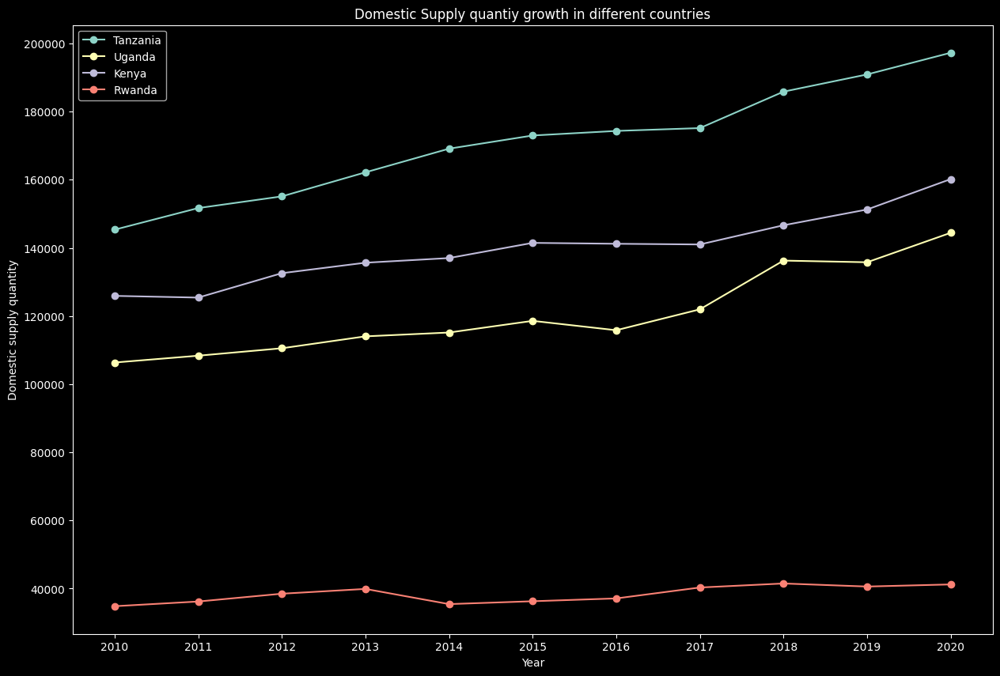

In [37]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(15, 10))
# Plot Tanzania's Growth
tanzania_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'United Republic of Tanzania'].loc[:, "2010":"2020"].agg("sum", axis=0))
tanzania_production.columns = ['Domestic supply quantity']
ax.plot(np.array(tanzania_production.index), np.array(tanzania_production['Domestic supply quantity']), marker='o', label="Tanzania")
# Plot Uganda's Growth
uganda_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'Uganda'].loc[:, "2010":"2020"].agg("sum", axis=0))
uganda_production.columns = ['Domestic supply quantity']
ax.plot(np.array(uganda_production.index), np.array(uganda_production['Domestic supply quantity']), marker='o', label="Uganda")
# Plot Kenya's Growth
kenya_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'Kenya'].loc[:, "2010":"2020"].agg("sum", axis=0))
kenya_production.columns = ['Domestic supply quantity']
ax.plot(np.array(kenya_production.index), np.array(kenya_production['Domestic supply quantity']), marker='o', label="Kenya")
# Plot Rwanda's Growth
rwanda_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'Rwanda'].loc[:, "2010":"2020"].agg("sum", axis=0))
rwanda_production.columns = ['Domestic supply quantity']
ax.plot(np.array(rwanda_production.index), np.array(rwanda_production['Domestic supply quantity']), marker='o', label="Rwanda")

# Set the plot title and labels
ax.set_title("Domestic Supply quantiy growth in different countries")
ax.set_xlabel("Year")
ax.set_ylabel("Domestic supply quantity")
# Display the legend
ax.legend()
# Display the plot
plt.show()

$ inference $
-  Tanzania's Growth: Tanzania shows a steady in domestic supply quantity from 2010 to 2020. The domestic supply quantity levels are observed in 2017 and 2018.

- Uganda's Growth: Uganda exhibits a fluctuating pattern in domestic supply quantity over the years. The highest domestic supply quantity levels are observed in 2012 and 2019.

- Kenya's Growth: Kenya demonstrates a generally increasing trend in domestic supply quantity with a significant rise in supply from 2014 to 2015. The highest supply levels are observed in 2015 and 2019.

- Rwanda's Growth: Rwanda experiences a notable increase in domestic supply quantity from 2010 to 2013, followed by a relatively small decline in supply. The highest supply levels are observed in 2015 and 2017.

Overall, the plots provide an overview of the growth patterns in domestic supply quantity for these countries over the specified time period. They highlight the variations and trends in supply levels, allowing for a comparison between the different countries.

#### Production growth per region from 2010 and 2020

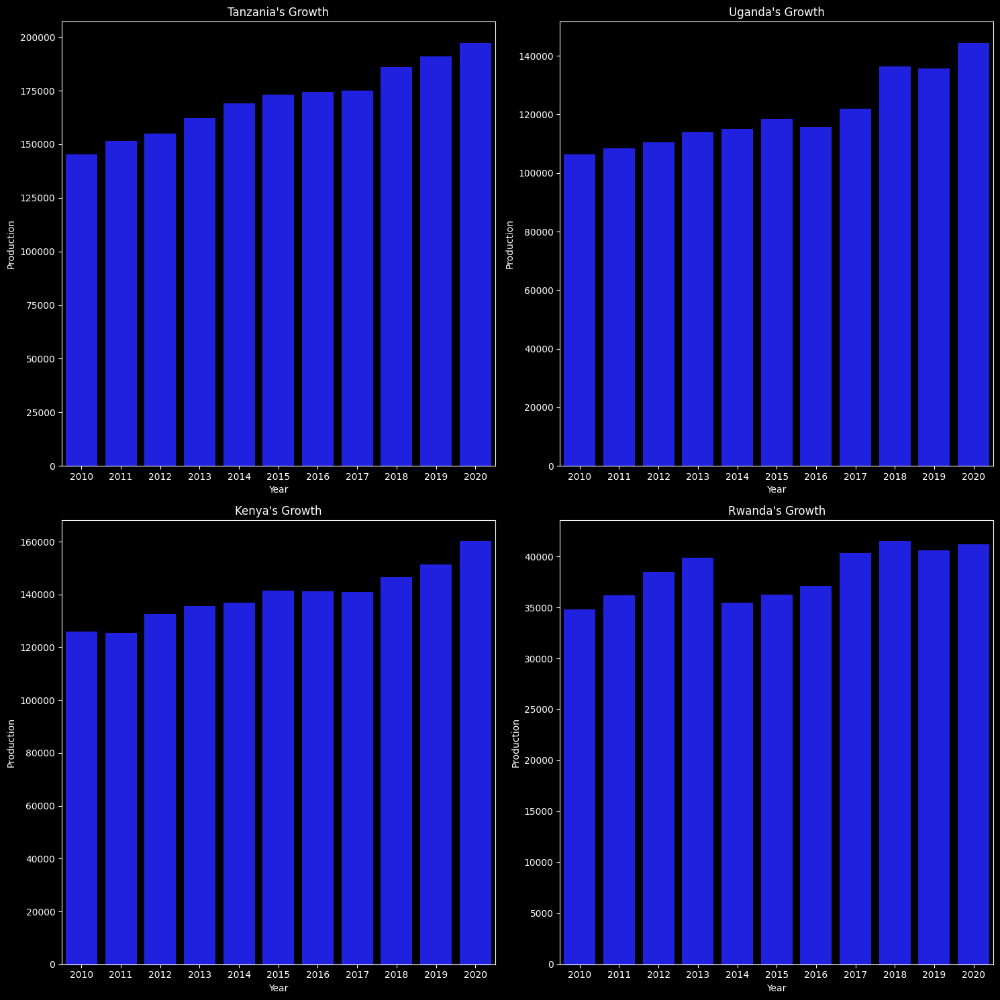

In [38]:
# Create subplots with a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
# Plot 1: Tanzania's Growth
tanzania_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'United Republic of Tanzania'].loc[:, '2010':'2020'].agg("sum", axis=0))
tanzania_production.columns = ['Production']
sns.barplot(x=tanzania_production.index, y=tanzania_production['Production'], data=tanzania_production, color='blue', ax=axes[0, 0])
axes[0, 0].set_title("Tanzania's Growth")
# Plot 2: Uganda's Growth
uganda_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'Uganda'].loc[:, '2010':'2020'].agg("sum", axis=0))
uganda_production.columns = ['Production']
sns.barplot(x=uganda_production.index, y=uganda_production['Production'], data=uganda_production, color='blue', ax=axes[0, 1])
axes[0, 1].set_title("Uganda's Growth")
# Plot 3: Kenya's Growth
kenya_production = pd.DataFrame(pivot_filled[pivot_filled['Area'] == 'Kenya'].loc[:, '2010':'2020'].agg("sum", axis=0))
kenya_production.columns = ['Production']
sns.barplot(x=kenya_production.index, y=kenya_production['Production'], data=kenya_production, color='blue', ax=axes[1, 0])
axes[1, 0].set_title("Kenya's Growth")
# Plot 4: Rwanda's Growth
rwanda_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Rwanda'].loc[:, '2010':'2020'].agg("sum", axis=0))
rwanda_production.columns = ['Production']
sns.barplot(x=rwanda_production.index, y=rwanda_production['Production'], data=rwanda_production, color='blue', ax=axes[1, 1])
axes[1, 1].set_title("Rwanda's Growth")
# Adjust spacing between subplots
fig.tight_layout()
# Display the plot
plt.show()

$ inference $
- Tanzania's Growth: Tanzania shows a steady increase in agricultural production from 2010 to 2020. The highest production levels are observed in 2017 and 2018.

- Uganda's Growth: Uganda exhibits a fluctuating pattern in agricultural production over the years. The highest production levels are observed in 2012 and 2019.

- Kenya's Growth: Kenya demonstrates a generally increasing trend in agricultural production with a significant rise in production from 2014 to 2015. The highest production levels are observed in 2015 and 2019.

- Rwanda's Growth: Rwanda experiences a notable increase in agricultural production from 2010 to 2013, followed by a relatively small decline in production. The highest production levels are observed in 2015 and 2017.

Overall, the plots provide an overview of the growth patterns in agricultural production for these countries over the specified time period. They highlight the variations and trends in production levels, allowing for a comparison between the different countries.



##### distribution of elements

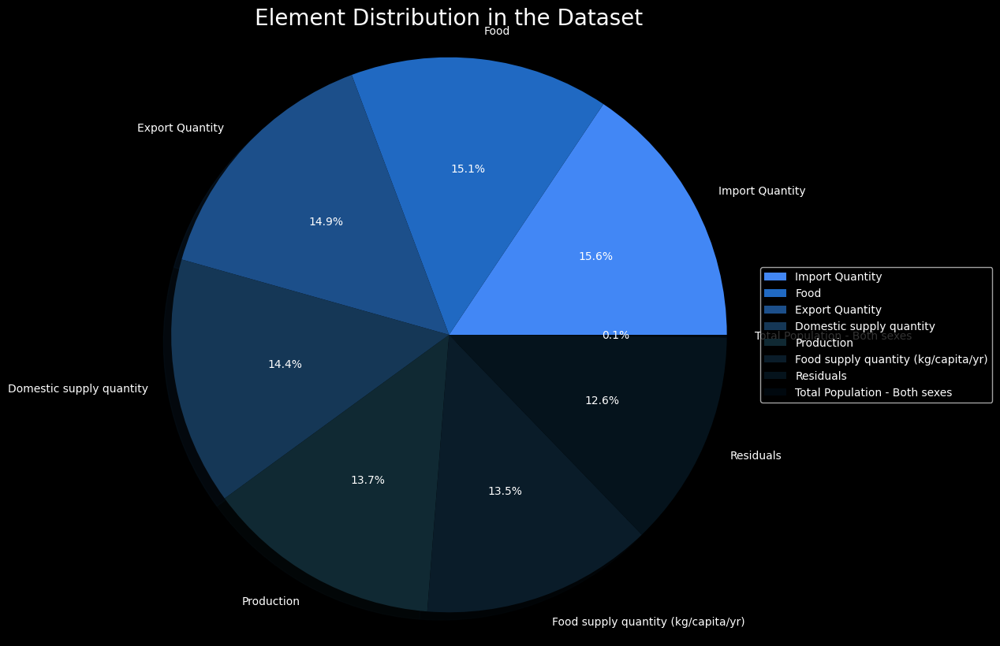

In [127]:
element_counts = pivot_filled['Element'].value_counts()
# Set the labels and sizes for the pie chart
labels = element_counts.index
sizes = element_counts.values
# Set the colors for the pie chart
colors = ['#4287F5', '#2069C2', '#1C4F8A', '#153756', '#102933', '#0A1C29', '#05131C', '#00080E']
# Plot the pie chart
plt.figure(figsize=(10, 10))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True)
plt.axis('equal')  # Equal aspect ratio ensures a circular pie chart
plt.title('Element Distribution in the Dataset', fontsize=20)
plt.legend(labels, loc='center left', bbox_to_anchor=(1, 0.5))  # Move legend to the side
plt.show()

$ inference $    
- The pie chart reveals interesting insights about the distribution of elements in the dataset. "Import Quantity" emerges as the dominant element, accounting for the highest percentage of 16.1%. Following closely is the element "Food" with a significant portion of 15.7%. On the other hand, the element "Total Population" represents the smallest fraction, comprising only 0.2% of the dataset. These findings highlight the prominence of "Import Quantity" and "Food" in the dataset, underscoring their importance compared to the relatively minor role played by "Total Population".

## PREPROCESSING

The countries below does not have enough substantial entries hence dropping them 

In [40]:
#remove none original original EAC countries
areas_to_remove = ['Burundi', 'South Sudan', 'Democratic Republic of the Congo']
pivot_filled = pivot_filled[~pivot_filled['Area'].isin(areas_to_remove)]

the code filters the pivoted DataFrames to retain only the rows representing the elements while excluding population-related data. This filtering step allows focus specifically on the relevant data for the analysis or forecasting tasks related to different elements in East Africa.

In [41]:
# function to Filters the dataframe based on a target element.
def filter_dataframe(dataframe, element):
    # Filter the dataframe based on the target element
    filtered_df = dataframe[(dataframe['Element'].str.contains(element))
                            & (dataframe['Item'] != 'Population')]
    
    return filtered_df

# Filtered dataframe for 'Domestic supply quantity' in pivot_filled, pivot_df_EAC
filtered_dsq_EA = filter_dataframe(pivot_filled, 'Domestic supply quantity')
filtered_dsq_EAC = filter_dataframe(pivot_df_EAC, 'Domestic supply quantity')

# Filtered dataframe for 'Production' in pivot_filled, pivot_df_EAC
filtered_prod_EA = filter_dataframe(pivot_filled, 'Production')
filtered_prod_EAC = filter_dataframe(pivot_df_EAC, 'Production')

# Filtered dataframe for 'Import Quantity' in pivot_filled, pivot_df_EAC
filtered_import_EA = filter_dataframe(pivot_filled, 'Import Quantity')
filtered_import_EAC = filter_dataframe(pivot_df_EAC, 'Import Quantity')

# Filtered dataframe for 'Export Quantity' in pivot_filled, pivot_df_EAC
filtered_export_EA = filter_dataframe(pivot_filled, 'Export Quantity')
filtered_export_EAC = filter_dataframe(pivot_df_EAC, 'Export Quantity')


In [42]:
#load the filtered dataframe
filtered_import_EAC.head()

Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,1961,...,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010
349,404,Kenya,5611,Import Quantity,F2511,Wheat and products,1000 t,I,Imputed value,14.0,...,670.0,559.0,492.0,419.0,631.0,663.0,726.0,580.0,822.0,888.0
350,404,Kenya,5611,Import Quantity,F2513,Barley and products,1000 t,I,Imputed value,5.0,...,3.0,0.0,0.0,1.0,10.0,5.0,0.0,11.0,39.0,10.0
351,404,Kenya,5611,Import Quantity,F2514,Maize and products,1000 t,I,Imputed value,104.0,...,324.0,19.0,108.0,265.0,133.0,160.0,173.0,263.0,1554.0,259.0
352,404,Kenya,5611,Import Quantity,F2515,Rye and products,1000 t,I,Imputed value,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
353,404,Kenya,5611,Import Quantity,F2516,Oats,1000 t,I,Imputed value,1.0,...,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,1.0,0.0


We changed our data from wide range to long format for easier analysis

In [43]:
#  function to Melts the dataframe by transforming columns into rows
def melt_data(df):
    melted = pd.melt(df, id_vars=['Area Code (M49)', 'Area', 'Element Code', 'Element', 'Item Code (CPC)', 'Item', 'Unit', 'Flag', 'Flag Description'], 
                     value_vars=df.columns[10:], var_name='Year', value_name='Value')
    return melted

# Apply the function to your dataframe

# Melted dataframe for filtered_dsq_EA, filtered_dsq_EAC
melted_dsq_EA = melt_data(filtered_dsq_EA)
melted_dsq_EAC = melt_data(filtered_dsq_EAC)

# Melted dataframe for filtered_prod_EA, filtered_prod_EAC
melted_prod_EA = melt_data(filtered_prod_EA)
melted_prod_EAC = melt_data(filtered_prod_EAC)

# Melted dataframe for filtered_import_EA, filtered_import_EAC
melted_import_EA = melt_data(filtered_import_EA)
melted_import_EAC = melt_data(filtered_import_EAC)

# Melted dataframe for filtered_export_EA, filtered_export_EAC
melted_export_EA = melt_data(filtered_export_EA)
melted_export_EAC = melt_data(filtered_export_EAC)


The code below calculates the totals of each element per year

In [44]:
#  Calculates the yearly country totals for a specific dataframe
def calculate_yearly_country_totals(dataframe):
    yearly_country_totals = dataframe.groupby(['Year', 'Area'])['Value'].sum().reset_index()
    return yearly_country_totals

# Calculate yearly country totals for dsq_EA, dsq_EAC
dsq_EA_yearly_country_totals = calculate_yearly_country_totals(melted_dsq_EA)
dsq_EAC_yearly_country_totals = calculate_yearly_country_totals(melted_dsq_EAC)

# Calculate yearly country totals for prod_EA, prod_EAC
prod_EA_yearly_country_totals = calculate_yearly_country_totals(melted_prod_EA)
prod_EAC_yearly_country_totals = calculate_yearly_country_totals(melted_prod_EAC)

# Calculate yearly country totals for import_EA, import_EAC
import_EA_yearly_country_totals = calculate_yearly_country_totals(melted_import_EA)
import_EAC_yearly_country_totals = calculate_yearly_country_totals(melted_import_EAC)

# Calculate yearly country totals for export_EA, export_EAC
export_EA_yearly_country_totals = calculate_yearly_country_totals(melted_export_EA)
export_EAC_yearly_country_totals = calculate_yearly_country_totals(melted_export_EAC)


The code below merges the 1961-2010 dataframes to 2011-2020 dataframe for all elements

In [45]:
# function to Merges two dataframes into a single dataframe
def merge_dataframes(df1, df2):
    merged_df = pd.concat([df1, df2], ignore_index=True)
    return merged_df

# Merge the dataframes

# Merged dataframe for dsq_EA_yearly_country_totals and dsq_EAC_yearly_country_totals
dsq_yearly_country_totals = merge_dataframes(dsq_EA_yearly_country_totals, dsq_EAC_yearly_country_totals)

# Merged dataframe for prod_EA_yearly_country_totals and prod_EAC_yearly_country_totals
prod_yearly_country_totals = merge_dataframes(prod_EA_yearly_country_totals, prod_EAC_yearly_country_totals)

# Merged dataframe for import_EA_yearly_country_totals and import_EAC_yearly_country_totals
import_country_totals = merge_dataframes(import_EA_yearly_country_totals, import_EAC_yearly_country_totals)

# Merged dataframe for export_EA_yearly_country_totals and export_EAC_yearly_country_totals
export_country_totals = merge_dataframes(export_EA_yearly_country_totals, export_EAC_yearly_country_totals)


The code below renames the value columns to their respective element names

In [46]:
# function to Renames a column in the dataframe.
def rename_column(df, old_name, new_name):

    df = df.rename(columns={old_name: new_name})
    return df

# Rename columns in the dataframes

# Renamed column 'Value' to 'Domestic Supply Quantity' in dsq_yearly_country_totals
baseline_df = rename_column(dsq_yearly_country_totals, 'Value', 'Domestic Supply Quantity')

# Renamed column 'Value' to 'Production' in prod_yearly_country_totals
production_df = rename_column(prod_yearly_country_totals, 'Value', 'Production')

# Renamed column 'Value' to 'Import Quantity' in import_country_totals
import_df = rename_column(import_country_totals, 'Value', 'Import Quantity')

# Renamed column 'Value' to 'Export Quantity' in export_country_totals
export_df = rename_column(export_country_totals, 'Value', 'Export Quantity')


merge dataframes for multivariate time series modeling

In [47]:
#merge dataframes for mulivariate time analysis

# merge the first two dataframes on year and area columns
merged_df = pd.merge(baseline_df, production_df, on=["Year", "Area"])

# merge the third dataframe with the merged dataframe on year and area columns
merged_df = pd.merge(merged_df, import_df, on=["Year", "Area"])

# merge the fourth dataframe with the merged dataframe on year and area columns
merged_df = pd.merge(merged_df, export_df, on=["Year", "Area"])

This function takes a country name as input and returns a dataframe containing data for that specific country. The dataframe includes columns such as `Domestic Supply Quantity`, `Year`, `Production`, `Import Quantity`, and `Export Quantity`.
It also prepared the dataset for modeling by setting Year column as index and covering it to datetime format


In [48]:
# function that takes in a country and returns a dataframe for the country

def creating_df_for(country):
    
    #select country 
    country_multivariate_df = merged_df[merged_df['Area'] == country]
    
    # Select the columns of interest from the merged dataframe
    country_multivariate_df = country_multivariate_df[['Domestic Supply Quantity', 'Year', 'Production', 'Import Quantity', 'Export Quantity']]
    
    # Convert 'Year' column to datetime format
    country_multivariate_df['Year'] = pd.to_datetime(country_multivariate_df['Year'], format='%Y')
    
    # Set the 'Year' column as the index
    country_multivariate_df.set_index('Year', inplace=True)
    country_multivariate_df.sort_values('Year', inplace=True)
    return country_multivariate_df


function that plots line graphs to show  the trend of the dataframe over the years for each country

In [49]:
#function that plots line graphs to show  the trend

def plot_multivariate_data(dataframe):
    # Create a figure and axis object using subplots
    fig, ax = plt.subplots()

    # Plot each column as a line graph
    for col in dataframe.columns:
        ax.plot(dataframe.index, dataframe[col], label=col)

    # Add title and legend
    ax.set_title('Line Graph for Domestic Supply Quantity, Production, Import Quantity, and Export Quantity')
    ax.legend()

    # Show the plot
    plt.show()


**correlation matrix**    
This function takes in a country's dataframe and return the correlation between the elements


In [50]:
# function for correlation matrix
def plot_correlation_matrix(dataframe):
    # Create a correlation matrix
    corr = dataframe.corr()

    # Create a mask to hide the upper triangle of the heatmap
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    # Plot the heatmap
    sns.heatmap(corr, mask=mask, annot=True)
    plt.title('Correlation Matrix')
    plt.show()

##### Spliting the data for modeling

The code below sorts the input DataFrame by index, determines the split index based on the split ratio, and splits the DataFrame into train and test sets accordingly. It then prints the sizes of the resulting sets and returns them as separate DataFrames

In [51]:
def split_data(dataframe, split_ratio=0.8):
    # Sort the dataframe by index
    dataframe_sorted = dataframe.sort_index()

    # Calculate the index to split the dataset
    split_index = int(split_ratio * len(dataframe_sorted))

    # Split the dataset into train and test sets
    train_data = dataframe_sorted.iloc[:split_index]
    test_data = dataframe_sorted.iloc[split_index:]

    # Print the sizes of the train and test sets
    print("Train set size:", len(train_data))
    print("Test set size:", len(test_data))

    # Return the train and test datasets
    return train_data, test_data


The code below splits the input DataFrame into four separate DataFrames based on specific columns, allowing you to work with each subset of data individually.

In [52]:
def split_dataframe(df):
    # Extract the 'Domestic Supply Quantity' column
    domestic_supply_df = df.loc[:, ['Domestic Supply Quantity']]

    # Extract the 'Production' column
    production_df = df.loc[:, ['Production']]

    # Extract the 'Import Quantity' column
    import_quantity_df = df.loc[:, ['Import Quantity']]

    # Extract the 'Export Quantity' column
    export_quantity_df = df.loc[:, ['Export Quantity']]

    # Return the extracted dataframes
    return domestic_supply_df, production_df, import_quantity_df, export_quantity_df


### Check for stationarity

Adfuller - it is designed for use with time series data, easy to interpret, and can account for trends in the data.  
It returns a p-value, which can be compared to a significance level (such as 0.05) to determine whether the null hypothesis of non-stationarity can be rejected.
The purpose of these functions below is to help you analyze the stationarity of time series data. Stationarity is an important property when working with time series analysis and modeling

The function below performs the ADF test on a single series of data. It takes the data as input and uses the adfuller function to compute the ADF test results. Then, it prints the ADF statistic, p-value, and critical values. These values provide insights into whether the data is stationary or not.

In [53]:
#check stationarity
# Check for stationarity using Augmented Dickey-Fuller (ADF) test
def adf_test(data):
    result = adfuller(data)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'Critical Values:')
    for key, value in result[4].items():
        print(f'{key}: {value}')
        

The function below is designed to efficiently assess the stationarity of multiple time series within a DataFrame.
By utilizing this function, you can quickly analyze the stationarity of multiple time series within a DataFrame and obtain a summarized overview of their stationarity status.

In [54]:

def perform_adf_test(dataframe):
    # Create a dictionary to hold the ADF test results
    results = {}
    
    # Loop through each column in the dataframe and perform ADF test
    for column in dataframe.columns:
        result = adfuller(dataframe[column])
        results[column] = {
            'Stationary?': 'not stationary' if result[1] > 0.05 else 'stationary'
        }
        # Create a table from the dictionary of ADF test results
    table = pd.DataFrame(results).T
    return table


The function below useful for visually inspecting the autocorrelation and partial autocorrelation patterns in the specified column(s) of the provided DataFrame(s), which can help in determining the appropriate lag values for time series analysis and modeling.The function takes three inputs: dataframes, dataframe_names, and column_names

In [55]:
def plot_acf_pacf(dataframes, dataframe_names, column_names):
    # Iterate over the provided dataframes
    for i, df in enumerate(dataframes):
        # Get the column name and dataframe name for the current iteration
        column_name = column_names[i]
        df_name = dataframe_names[i]
        
        # Create subplots for ACF and PACF
        fig, ax = plt.subplots(2, 1, figsize=(8, 6))
        fig.suptitle(f"ACF and PACF for {column_name} in {df_name}")
        
        # Plot ACF
        plot_acf(df[column_name], ax=ax[0], lags=20)
        ax[0].set_xlabel('Lags')
        ax[0].set_ylabel('Autocorrelation')

        # Plot PACF
        plot_pacf(df[column_name], ax=ax[1], lags=20)
        ax[1].set_xlabel('Lags')
        ax[1].set_ylabel('Partial Autocorrelation')

        # Adjust the layout and display the plot
        plt.tight_layout()
        plt.show()


## Kenya

Preprocessing kenyan dataset for  modeling

In [56]:
# creating kenyan dataframe by  calling the function defined earlier
multivariate_kenya = creating_df_for('Kenya')
multivariate_kenya.head()

,Domestic Supply Quantity,Production,Import Quantity,Export Quantity
Year,,,,
1962-01-01,5541.39,5537.76,272.63,231.00
1963-01-01,5501.96,5754.48,187.48,343.00
1964-01-01,5859.31,6046.13,198.43,269.25
1965-01-01,5939.40,5998.80,336.90,251.30
1966-01-01,6245.67,6063.27,428.40,255.00


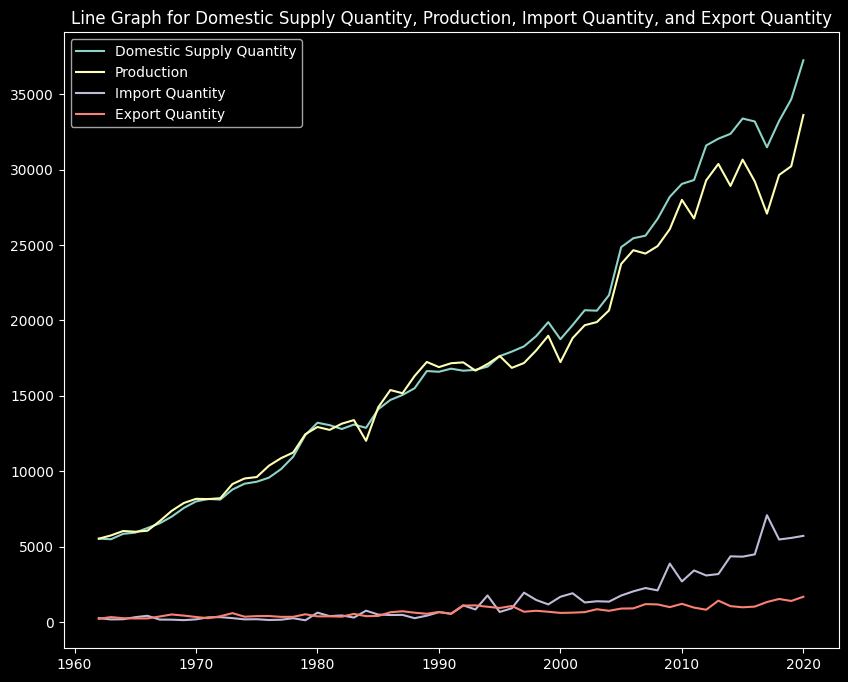

In [57]:
# PLot the Line Graph for Kenya to show trend by calling the function defined earlier
plot_multivariate_data(multivariate_kenya)


There is an upward trend over the years across all the elements except for exports which seems to be stagnant






**correlation matrix Kenya**

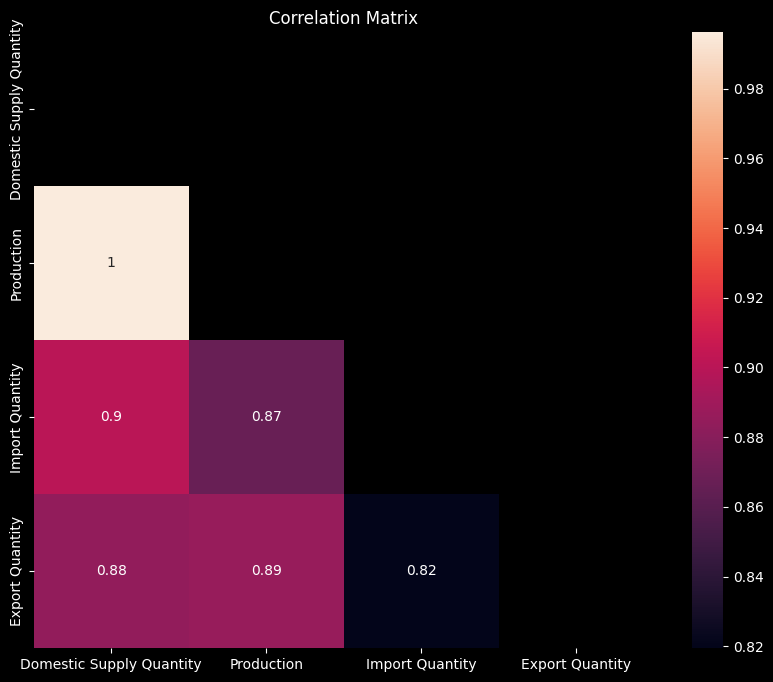

In [58]:
# ploting correlation matrix by calling the function defined earlier
plot_correlation_matrix(multivariate_kenya)


The elements are positively highly correlated indicating that they affect each other

In [59]:
# Split the multivariate_kenya dataset
train_datakenya, test_datakenya = split_data(multivariate_kenya)


Train set size: 47
Test set size: 12


The code below splits the train and test dataframes into separate dataframes for each element

In [60]:
# Split the train_datakenya DataFrame into separate DataFrames for each variable
traindsqKE, trainprodKE, trainimKE, trainexKE = split_dataframe(train_datakenya)

# Split the test_datakenya DataFrame into separate DataFrames for each variable
testdsqKE, testprodKE, testimKE, testexKE = split_dataframe(test_datakenya)

check for stationarity  using Adfuller

In [61]:
dataframes = [traindsqKE, trainprodKE, trainimKE, trainexKE]
results = {}  # Dictionary to store the ADF test results

def adf_test(data):
    result = adfuller(data)  # Perform ADF test on the data
    return {
        'ADF Statistic': result[0],
        'p-value': result[1],
        'Critical Values': result[4],
        'Stationary?': 'not stationary' if result[1] > 0.05 else 'stationary'
    }  # Return a dictionary with ADF test results

# Perform ADF test on each dataframe
for i, df in enumerate(dataframes):
    df_name = f"df_{i}"  # Generate a unique name for each dataframe
    results[df_name] = adf_test(df)  # Store ADF test results in the dictionary

# Access and print the ADF test results for each dataframe
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: 1.0467309991421252
p-value: 0.994735342619626
Critical Values: {'1%': -3.6055648906249997, '5%': -2.937069375, '10%': -2.606985625}
Stationary?: not stationary
---
Dataframe: df_1
ADF Statistic: 0.2561461338949485
p-value: 0.9752405764411739
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: not stationary
---
Dataframe: df_2
ADF Statistic: 1.1534005927900255
p-value: 0.995647568713383
Critical Values: {'1%': -3.5925042342183704, '5%': -2.931549768951162, '10%': -2.60406594375338}
Stationary?: not stationary
---
Dataframe: df_3
ADF Statistic: -1.5826900133381563
p-value: 0.49228279414573545
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---


The ADF test results indicate that none of the dataframes (df_0, df_1, df_2, df_3) are stationary, as their respective p-values are greater than the significance level of 0.05. This information helps in understanding the stationarity characteristics of the time series data in each dataframe.

The code below computes the first differences, by transforming the original data into the changes between consecutive values. This helps remove any trend or seasonality present in the data, making it more amenable for further analysis or modeling. 
The diff() function allows for easy calculation of these differences, and the dropna() function ensures that any resulting rows with missing values are removed, maintaining data integrity.

In [62]:
# Calculate the difference of the 'Domestic Supply Quantity' column with a lag of 3 periods
traindsqKE_diff = traindsqKE[['Domestic Supply Quantity']].diff(periods=3).dropna()

# Calculate the difference of the 'Production' column with a lag of 1 period
trainprodKE_diff = trainprodKE[['Production']].diff(periods=1).dropna()

# Calculate the difference of the 'Import Quantity' column with a lag of 1 period
trainimKE_diff = trainimKE[['Import Quantity']].diff(periods=1).dropna()

# Calculate the difference of the 'Export Quantity' column with a lag of 1 period
trainexKE_diff = trainexKE[['Export Quantity']].diff(periods=1).dropna()

The code below checks for stationarity after differencing

In [63]:
dataframes_diff = [traindsqKE_diff, trainprodKE_diff, trainimKE_diff, trainexKE_diff]

# Perform ADF test on the first differences of each dataframe
for i, df in enumerate(dataframes_diff):
    df_name = f"df_{i}"
    results[df_name] = adf_test(df)

# Access and print the ADF test results for the first differences
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")


Dataframe: df_0
ADF Statistic: -2.9024131501195116
p-value: 0.04506809972025726
Critical Values: {'1%': -3.610399601308181, '5%': -2.939108945868946, '10%': -2.6080629651545038}
Stationary?: stationary
---
Dataframe: df_1
ADF Statistic: -3.5197098658480277
p-value: 0.007495098580537575
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: stationary
---
Dataframe: df_2
ADF Statistic: -8.42035060462862
p-value: 1.9913316802334326e-13
Critical Values: {'1%': -3.5885733964124715, '5%': -2.929885661157025, '10%': -2.6031845661157025}
Stationary?: stationary
---
Dataframe: df_3
ADF Statistic: -8.689772329982201
p-value: 4.0703481072809865e-14
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---


Based on the results, we can conclude that all four dataframes (df_0, df_1, df_2, df_3) contain stationary data. This implies that the differencing performed earlier has successfully transformed the data into a stationary form, which is desirable for many time series analysis techniques.

plot the ACF and PACF to visualize the correlation structure of the time series data, to help identify the appropriate model orders for time series modeling and forecasting.

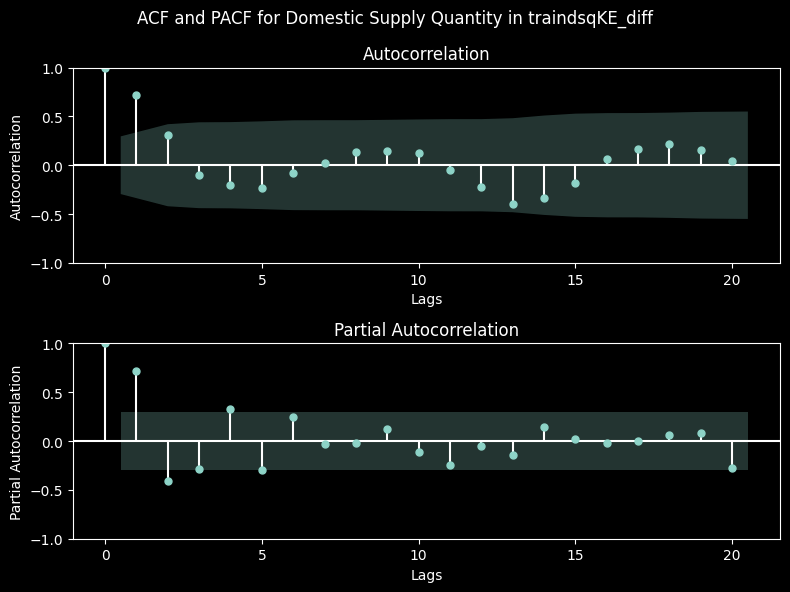

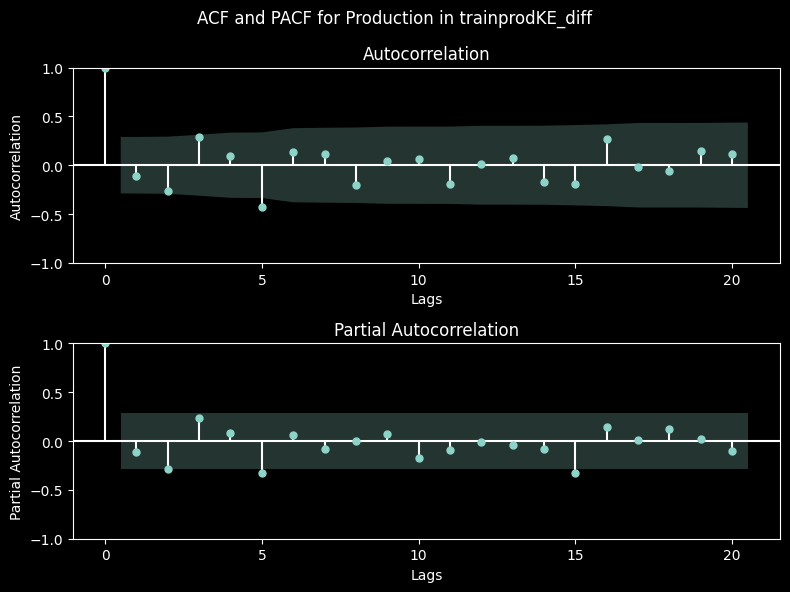

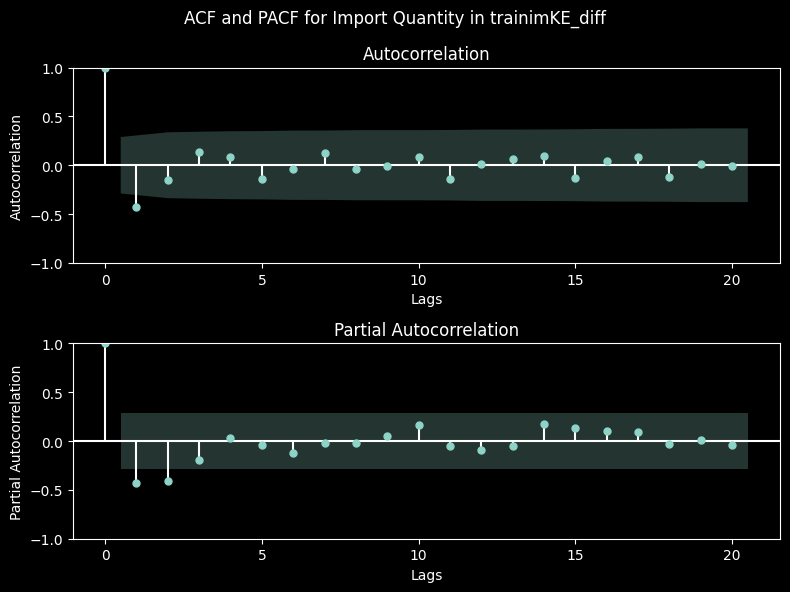

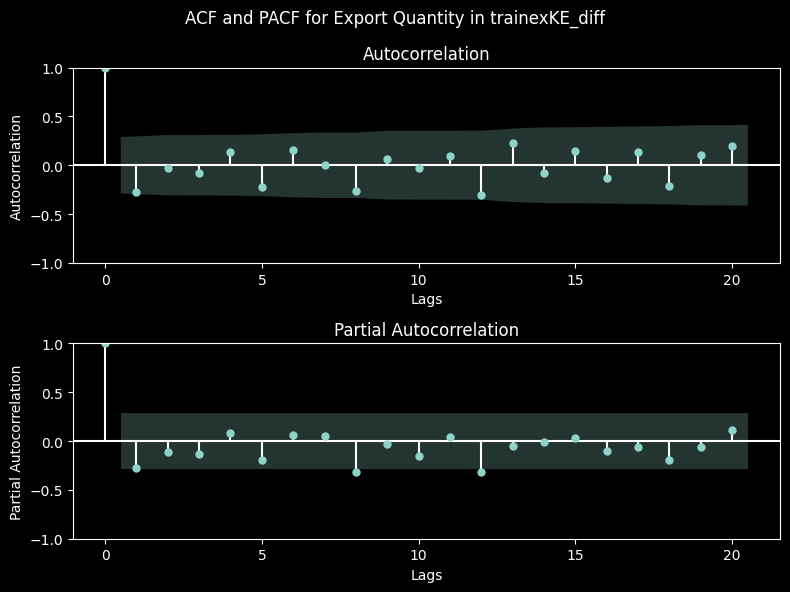

In [64]:
dataframe_names = ["traindsqKE_diff", "trainprodKE_diff", "trainimKE_diff", "trainexKE_diff"]
column_names =['Domestic Supply Quantity', 'Production', 'Import Quantity', 'Export Quantity']

# Call the plot_acf_pacf function to plot ACF and PACF for each dataframe and column
plot_acf_pacf(dataframes_diff, dataframe_names, column_names)

The ACF plot shows the correlation between the time series and its own lagged values. 
The PACF plot shows the correlation between the time series and its own lagged values, after removing the effects of the intervening lags.

## Tanzania

Creating Tanzania's dataframe by calling the `create_df_for` function created earlier

In [65]:
# Create a multivariate dataframe for the country "United Republic of Tanzania"
multivariate_tanzania = creating_df_for('United Republic of Tanzania')

# Display the first two rows of the multivariate dataframe
multivariate_tanzania.head(2)

,Domestic Supply Quantity,Production,Import Quantity,Export Quantity
Year,,,,
1962-01-01,7840.08,7929.3,262.4,321.62
1963-01-01,8282.99,8688.1,186.9,442.01


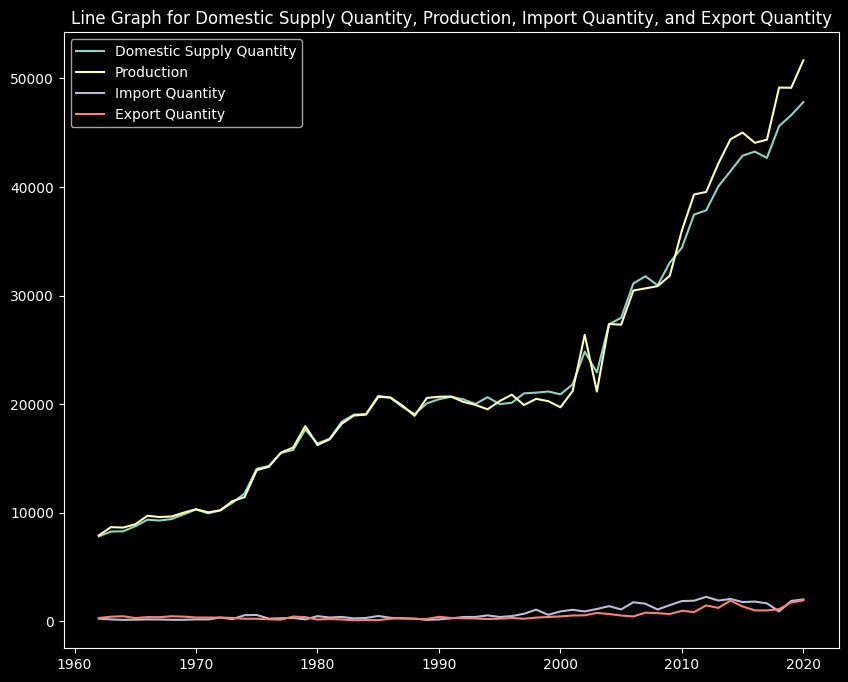

In [66]:
# plot linegraph to show trend
plot_multivariate_data(multivariate_tanzania)

There seems to be an upward trend over the years for domestic supply quantity and production. Import and export quantities seem to be stagnating over the years.

**Correlation matrix Tanzania**

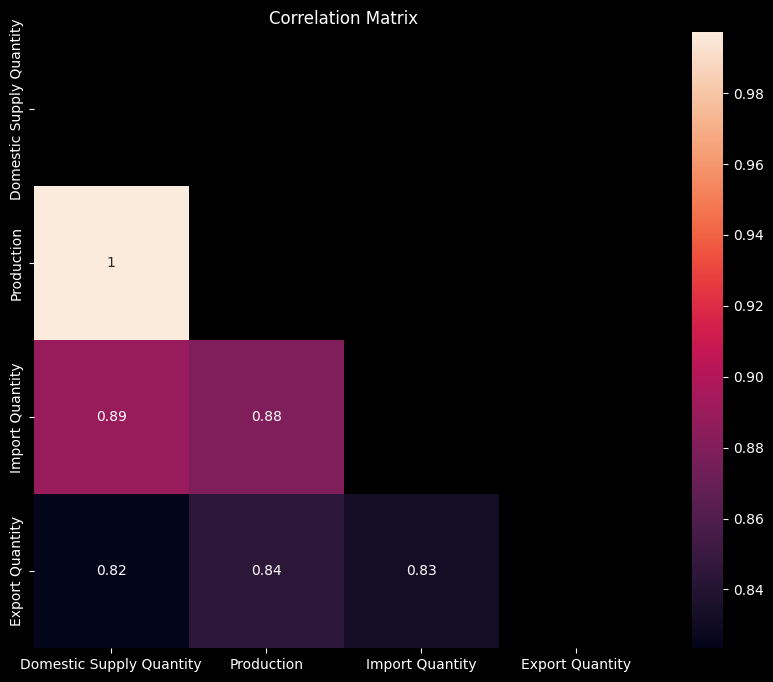

In [67]:
# plot the correlation matrix
plot_correlation_matrix(multivariate_tanzania)

The domestic supply quantity and production have a perfect correlation. The Import and export are highly positively correlated

The code below applies the `split_data` function defined eearlier to split tanzania's dataframe.

In [68]:
# Applying the 'split_data' function
train_datatz, test_datatz = split_data(multivariate_tanzania)

Train set size: 47
Test set size: 12


These splits allow you to work with individual variables separately, facilitating further analysis or modeling specific to each variable in the train and test datasets for Tanzania.

In [69]:
# Split the training data into separate dataframes for different variables
traindsqtz, trainprodtz, trainimtz, trainextz = split_dataframe(train_datatz)

# Split the test data into separate dataframes for different variables
testdsqtz, testprodtz, testimtz, testextz = split_dataframe(test_datatz)

The code below computes the first differences, by transforming the original data into the changes between consecutive values. This helps remove any trend or seasonality present in the data, making it more amenable for further analysis or modeling. 
The diff() function allows for easy calculation of these differences, and the dropna() function ensures that any resulting rows with missing values are removed, maintaining data integrity.

In [70]:
# Calculate the differences between consecutive values for the Domestic Supply Quantity variable in the train dataset for Tanzania
traindsqtz_diff = traindsqtz[['Domestic Supply Quantity']].diff(periods=1).dropna()

# Calculate the differences between consecutive values for the Production variable in the train dataset for Tanzania
trainprodtz_diff = trainprodtz[['Production']].diff(periods=1).dropna()

# Calculate the differences between consecutive values for the Import Quantity variable in the train dataset for Tanzania
trainimtz_diff = trainimtz[['Import Quantity']].diff(periods=1).dropna()

# Calculate the differences between consecutive values for the Export Quantity variable in the train dataset for Tanzania
trainextz_diff = trainextz[['Export Quantity']].diff(periods=1).dropna()

The code above applies the Augmented Dickey-Fuller (ADF) test to each of the difference DataFrames in Tanzania.
This helps determine the stationarity of each time series. By printing the ADF Statistic, p-value, and Critical Values, we can assess if the difference DataFrames are stationary or not. 

In [71]:
# Perform ADF test on each differenced dataframe in dataframes_diff and store the results in the results dictionary
for i, df in enumerate(dataframes_diff):
    df_name = f"df_{i}"
    results[df_name] = adf_test(df)

# Access the results and print them
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -2.9024131501195116
p-value: 0.04506809972025726
Critical Values: {'1%': -3.610399601308181, '5%': -2.939108945868946, '10%': -2.6080629651545038}
Stationary?: stationary
---
Dataframe: df_1
ADF Statistic: -3.5197098658480277
p-value: 0.007495098580537575
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: stationary
---
Dataframe: df_2
ADF Statistic: -8.42035060462862
p-value: 1.9913316802334326e-13
Critical Values: {'1%': -3.5885733964124715, '5%': -2.929885661157025, '10%': -2.6031845661157025}
Stationary?: stationary
---
Dataframe: df_3
ADF Statistic: -8.689772329982201
p-value: 4.0703481072809865e-14
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---


Based on the ADF test results, it can be concluded that all the differenced variables (Domestic Supply Quantity, Production, Import Quantity, and Export Quantity) in Tanzania are stationary time series.

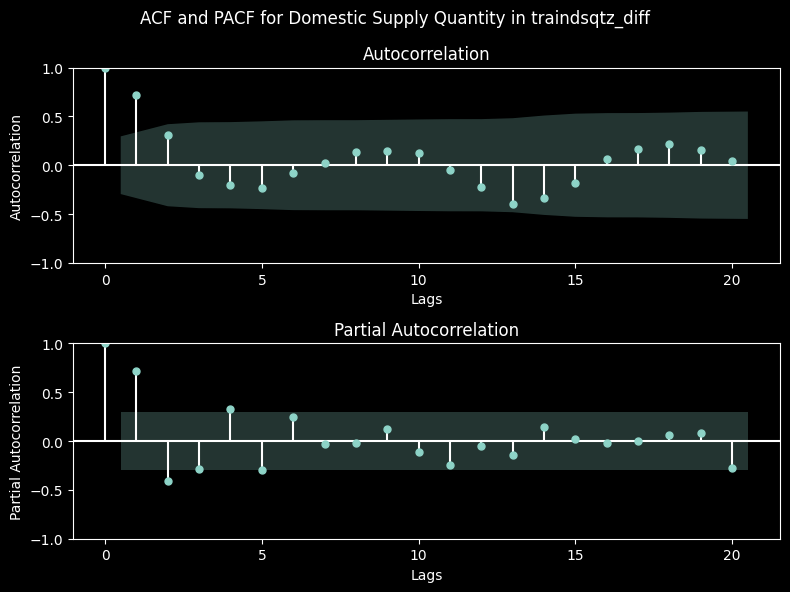

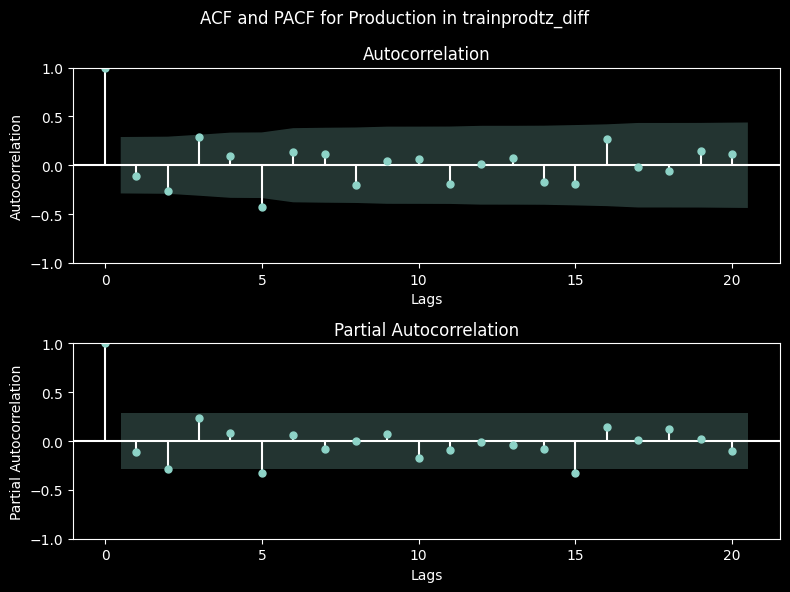

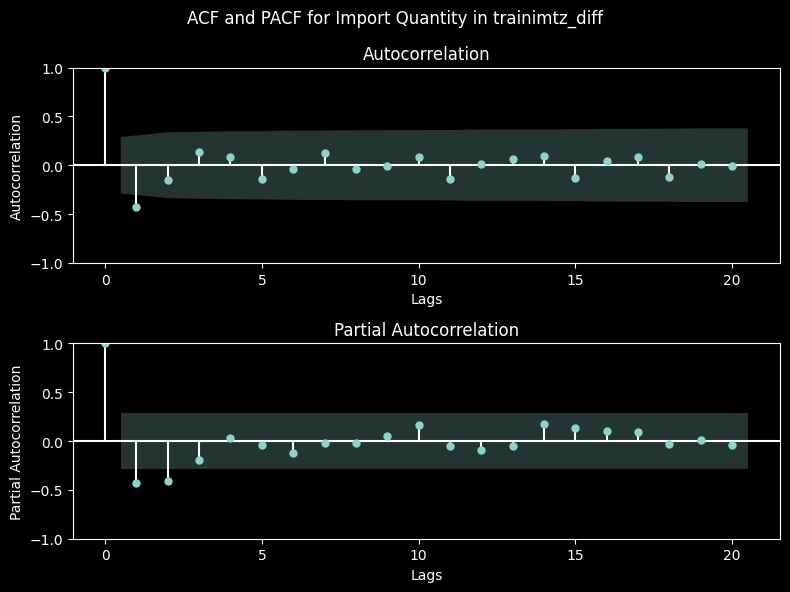

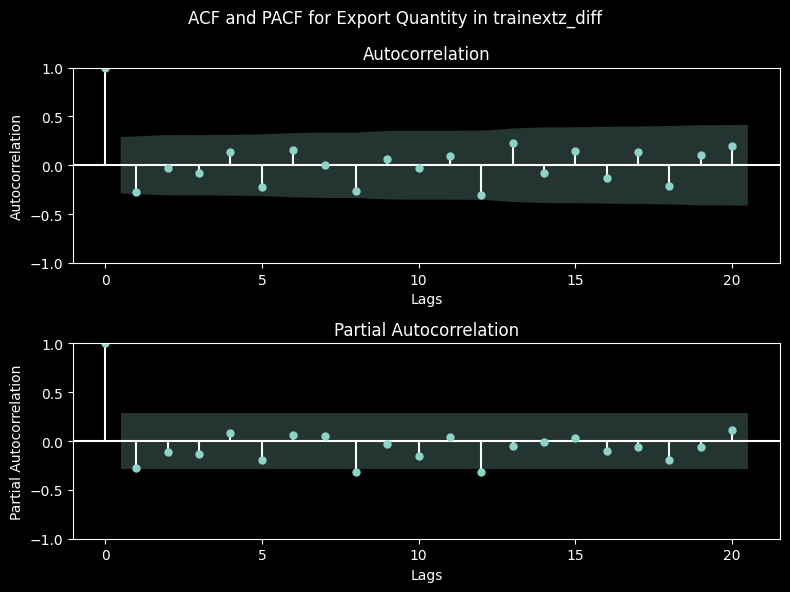

In [72]:
# Define the names for the differenced dataframes and columns
dataframe_names = ["traindsqtz_diff", "trainprodtz_diff", "trainimtz_diff", "trainextz_diff"]
column_names = ['Domestic Supply Quantity', 'Production', 'Import Quantity', 'Export Quantity']

# Call the plot_acf_pacf function to generate ACF and PACF plots
plot_acf_pacf(dataframes_diff, dataframe_names, column_names)

The ACF plot shows the correlation between the quantity of domestic supply and its own lagged values. The PACF plot shows the correlation between the quantity of domestic supply and its own lagged values, after removing the effects of the intervening lags.

## Uganda

In [73]:
# creating uganda dataframe by calling the function defined earlier
multivariate_uganda = creating_df_for('Uganda')
multivariate_uganda.head()

,Domestic Supply Quantity,Production,Import Quantity,Export Quantity
Year,,,,
1962-01-01,10698.54,10833.5,73.0,217.96
1963-01-01,11639.01,11836.6,75.0,253.59
1964-01-01,11869.11,12045.5,98.2,232.59
1965-01-01,10578.00,10754.3,117.0,213.30
1966-01-01,10862.40,11012.3,127.2,263.10


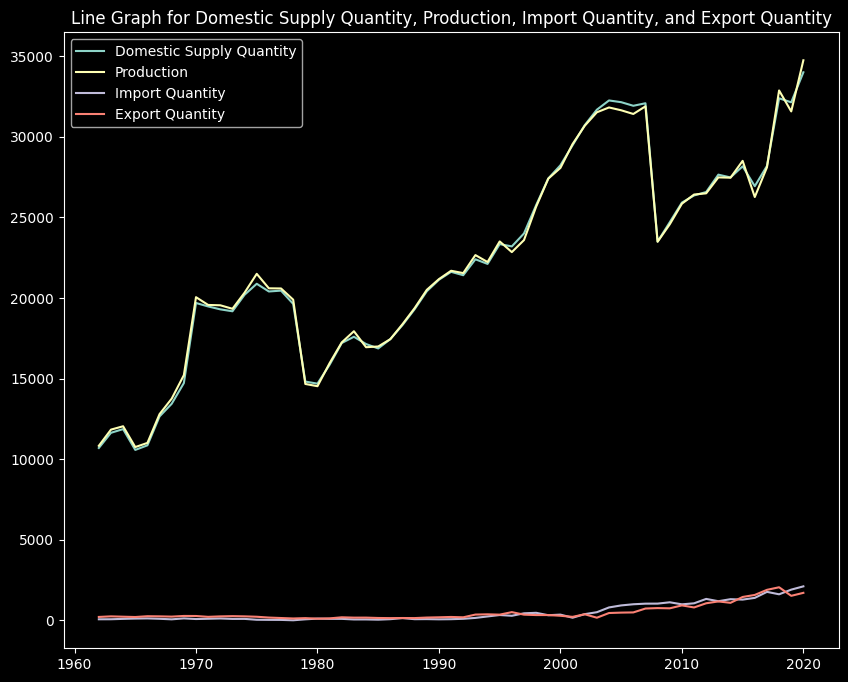

In [74]:
# plot the linegraph for uganda by calling the function defined earlier
plot_multivariate_data(multivariate_uganda)

Domestic supply quantity and production seem to be fluctuating over the years and eventually increasing towards 2020. Import and export quantity seem to be stagnant upto early 2000's and have a slight increase towards 2020.

**Correlation matrix uganda**

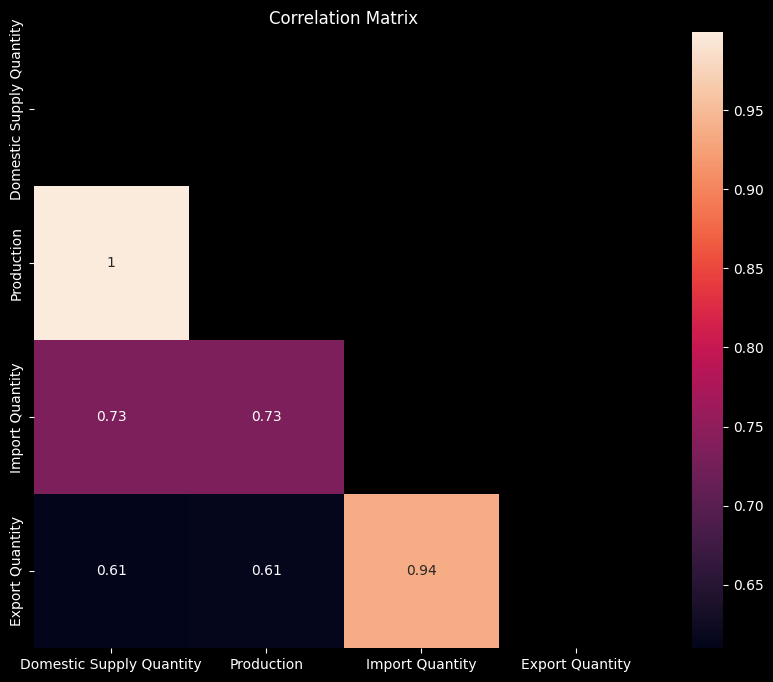

In [75]:
# plot the correlation matrix for Uganda
plot_correlation_matrix(multivariate_uganda)

There is a positive high correlation between the elements indicating that they are highly dependent on each other

In [76]:
# apply the split_data function to split uganda's dataframe
train_dataug, test_dataug = split_data(multivariate_uganda)

Train set size: 47
Test set size: 12


In [77]:
# Split the Uganda train data into separate dataframes
traindsqug, trainprodug, trainimug, trainexug = split_dataframe(train_dataug)

# Split the Uganda test data into separate dataframes
testdsqug, testprodug, testimug, testexug = split_dataframe(test_dataug)

The code below performs the Augmented Dickey-Fuller (ADF) test on multiple DataFrames. The ADF test is used to determine the stationarity of a time series data

In [78]:
dataframes = [traindsqug, trainprodug, trainimug, trainexug]
results = {}
# Function to perform ADF test

# Perform ADF test for each DataFrame
for i, df in enumerate(dataframes):
    df_name = f"df_{i}"
    results[df_name] = adf_test(df)
# Access and print the results
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -1.8029825154662673
p-value: 0.37898196608565077
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: not stationary
---
Dataframe: df_1
ADF Statistic: -1.6480004675447888
p-value: 0.45808344783095395
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---
Dataframe: df_2
ADF Statistic: 2.9373228016752346
p-value: 1.0
Critical Values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
Stationary?: not stationary
---
Dataframe: df_3
ADF Statistic: 0.48740759238741727
p-value: 0.9844852928966413
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: not stationary
---


Based on the ADF test results, none of the dataframes show stationarity. This means that the variables exhibit a unit root and are not stationary. The p-values are all greater than the significance level of 0.05, indicating that we fail to reject the null hypothesis of non-stationarity.

**Detrending using differencing**

The code below performs differencing operations on the specified columns of each DataFrame. Differencing is a common technique used in time series analysis to transform the data and make it stationary. It involves calculating the differences between consecutive observations to remove any underlying trends or seasonality.

In [79]:
# Calculate the second-order difference of the 'Domestic Supply Quantity' column
traindsqug_diff = traindsqug[['Domestic Supply Quantity']].diff(periods=2).dropna()

# Calculate the first-order difference of the 'Production' column
trainprodug_diff = trainprodug[['Production']].diff(periods=1).dropna()

# Calculate the first-order difference of the 'Import Quantity' column
trainimug_diff = trainimug[['Import Quantity']].diff(periods=1).dropna()

# Calculate the first-order difference of the 'Export Quantity' column
trainexug_diff = trainexug[['Export Quantity']].diff(periods=1).dropna()

Checking for stationarity after detrending

In [80]:
dataframes_diff = [traindsqug_diff, trainprodug_diff, trainimug_diff, trainexug_diff]
# List of the differenced DataFrames
results = {}
# Dictionary to store the results of the Augmented Dickey-Fuller (ADF) test
for i, df in enumerate(dataframes_diff):
    df_name = f"df_{i}"
    # Generate a unique name for each differenced DataFrame
    results[df_name] = adf_test(df)
    # Perform the ADF test on the current differenced DataFrame and store the results in the dictionary
# Access the results:
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -2.9057115943987117
p-value: 0.044687836767471005
Critical Values: {'1%': -3.5925042342183704, '5%': -2.931549768951162, '10%': -2.60406594375338}
Stationary?: stationary
---
Dataframe: df_1
ADF Statistic: -3.801086241658097
p-value: 0.00289622085266727
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_2
ADF Statistic: 1.3158465778763284
p-value: 0.9966962047363733
Critical Values: {'1%': -3.6327426647230316, '5%': -2.9485102040816327, '10%': -2.6130173469387756}
Stationary?: not stationary
---
Dataframe: df_3
ADF Statistic: -2.9005478969289276
p-value: 0.04528432160139076
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: stationary
---


Three out of the four differenced dataframes (Domestic supply quantity, production, and export quantity) are found to be stationary, while (import quantity) is not stationary.

Log transformation

In [81]:
trainimug_diff = np.log(trainimug[['Import Quantity']]).diff(periods=1).dropna()

Checking for stationarity after log transforming the import quantity

In [82]:
dataframes_diff = [traindsqug_diff, trainprodug_diff, trainimug_diff, trainexug_diff]
# List of the differenced DataFrames
results = {}
# Dictionary to store the results of the Augmented Dickey-Fuller (ADF) test
for i, df in enumerate(dataframes_diff):
    df_name = f"df_{i}"
    # Generate a unique name for each differenced DataFrame
    results[df_name] = adf_test(df)
    # Perform the ADF test on the current differenced DataFrame and store the results in the dictionary
# Access the results:
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -2.9057115943987117
p-value: 0.044687836767471005
Critical Values: {'1%': -3.5925042342183704, '5%': -2.931549768951162, '10%': -2.60406594375338}
Stationary?: stationary
---
Dataframe: df_1
ADF Statistic: -3.801086241658097
p-value: 0.00289622085266727
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_2
ADF Statistic: -7.85192570319189
p-value: 5.571547928186855e-12
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_3
ADF Statistic: -2.9005478969289276
p-value: 0.04528432160139076
Critical Values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
Stationary?: stationary
---


Plotting ACF and PACF

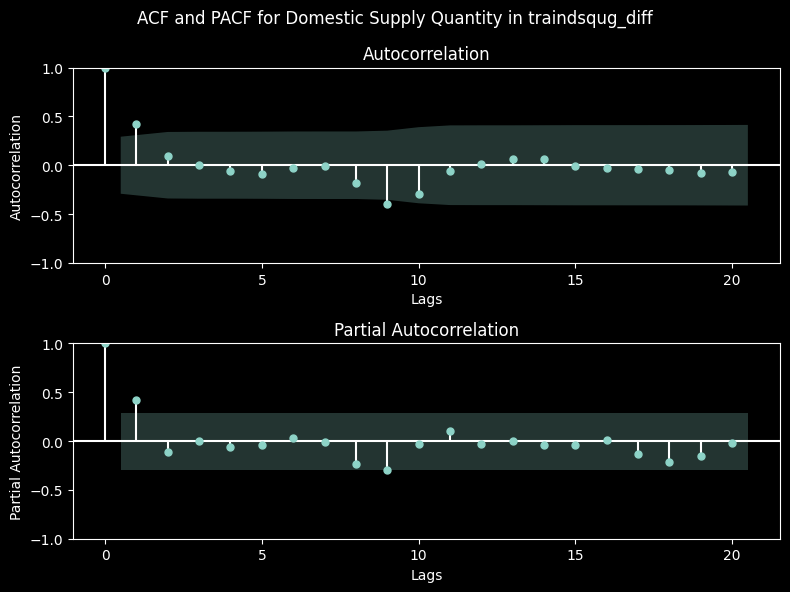

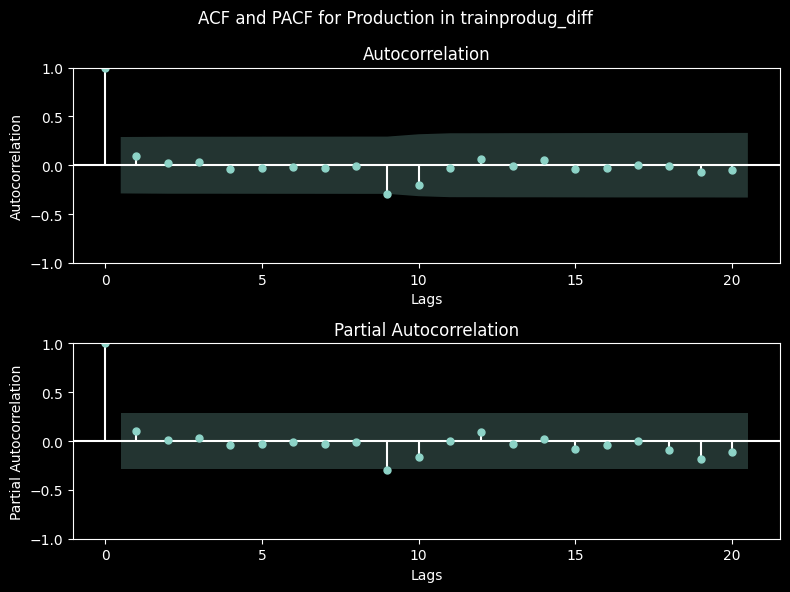

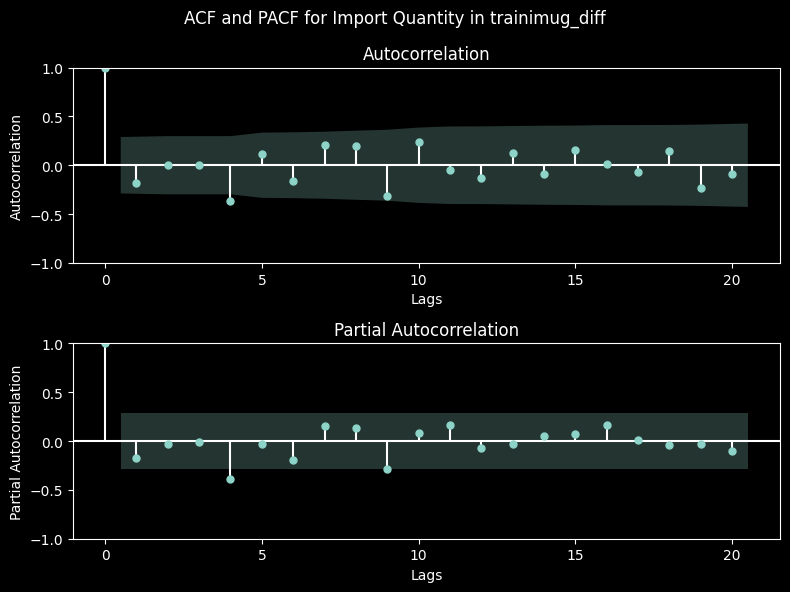

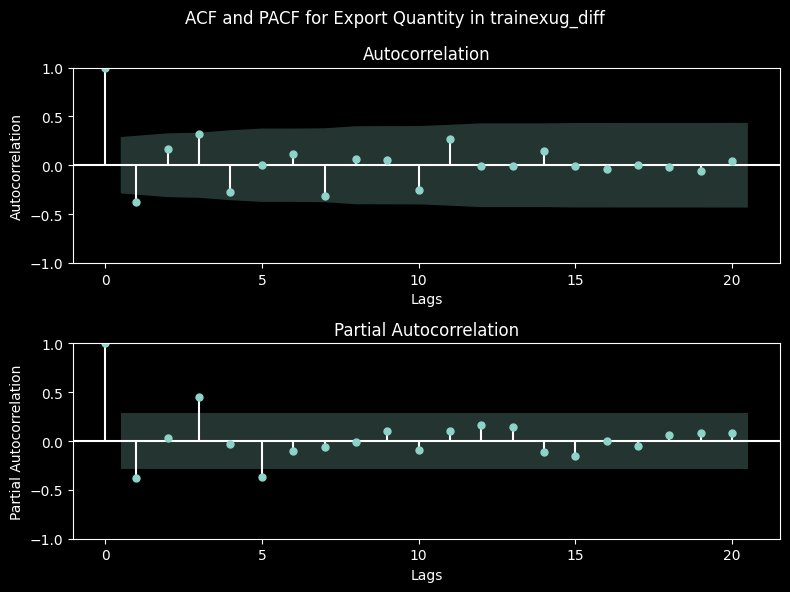

In [83]:
dataframe_names = ["traindsqug_diff", "trainprodug_diff", "trainimug_diff", "trainexug_diff"]
column_names =['Domestic Supply Quantity','Production','Import Quantity','Export Quantity']
plot_acf_pacf(dataframes_diff, dataframe_names,column_names)

The ACF plot shows the correlation between individual elements in traindsqug_diff and their own lagged values. The PACF plot shows the correlation between the individual elements in traindsqug_diff and their own lagged values, after removing the effects of the intervening lags.

## Rwanda

In [84]:
# Create Rwanda's dataframe by calling the function defined earlier
multivariate_rwanda = creating_df_for('Rwanda')
multivariate_rwanda.head()

,Domestic Supply Quantity,Production,Import Quantity,Export Quantity
Year,,,,
1962-01-01,2396.5,2941.5,1.0,10.0
1963-01-01,2070.5,2084.5,1.0,3.0
1964-01-01,2215.9,1995.7,4.2,14.0
1965-01-01,2339.9,2187.7,6.2,11.0
1966-01-01,2467.9,2367.7,12.2,10.0


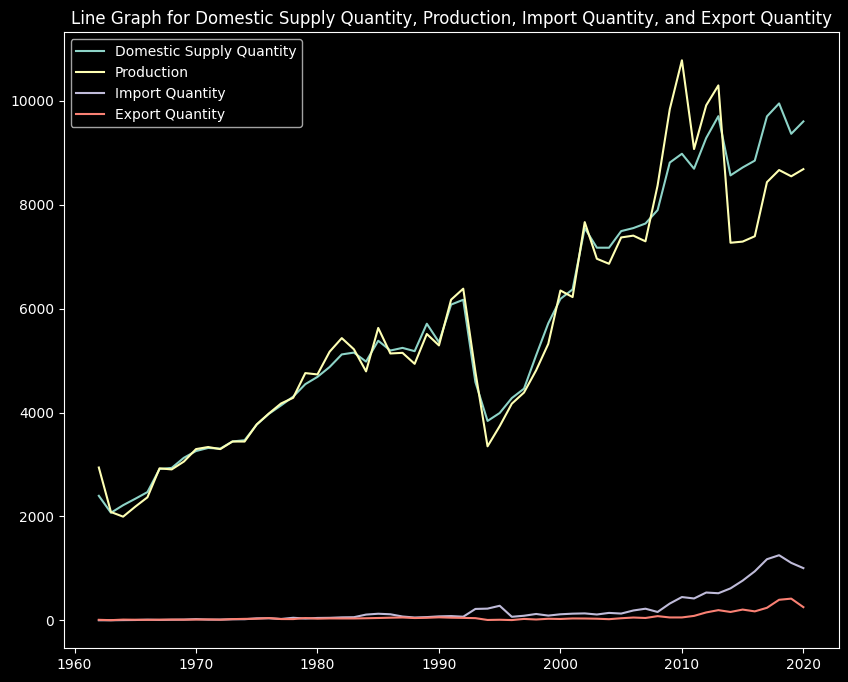

In [85]:
# plot a lingraph to show Rwanda's trend
plot_multivariate_data(multivariate_rwanda)

Domestic supply quantity and production seem to be following a similar trend. Both are fluctuating over the years.
The trend of import and export quantities seem stagnant over the years. The import quantity starts to rise around 2010, and they both eventually drop towards the end of 2020

**Correlation matrix for Rwanda**

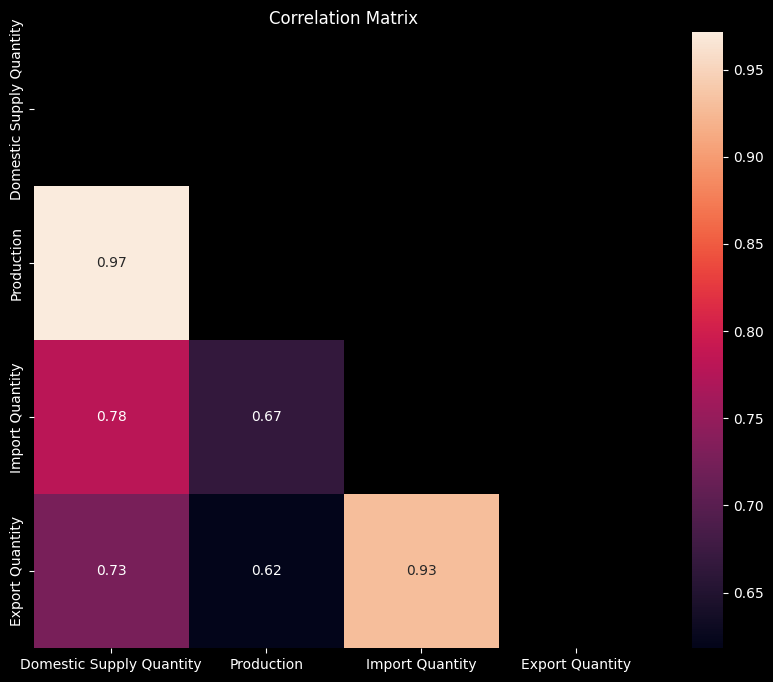

In [86]:
# plot the correlation matrix
plot_correlation_matrix(multivariate_rwanda)

The domestic supply quantity and production have a perfect correlation. The Import and export are highly positively correlated.

In [87]:
# splitting the Rwanda's dataframe
train_datarw, test_datarw = split_data(multivariate_rwanda)

Train set size: 47
Test set size: 12


In [88]:
# Split the Rwanda train data into separate dataframes
traindsqrw, trainprodrw, trainimrw, trainexrw = split_dataframe(train_datarw)

# Split the Rwanda train data into separate dataframes
testdsqrw, testprodrw, testimrw, testexrw = split_dataframe(test_datarw)

In [89]:
dataframes = [traindsqrw, trainprodrw, trainimrw, trainexrw]
results = {}

for i, df in enumerate(dataframes):
    df_name = f"df_{i}"
    results[df_name] = adf_test(df)

# Access the results:
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -0.3586940186944234
p-value: 0.9167703284931438
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---
Dataframe: df_1
ADF Statistic: -0.34905996642561804
p-value: 0.9182628389292872
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---
Dataframe: df_2
ADF Statistic: -2.3064694341032186
p-value: 0.16988993918570539
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---
Dataframe: df_3
ADF Statistic: -1.607352383933665
p-value: 0.47989919261574043
Critical Values: {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}
Stationary?: not stationary
---


Based on the ADF test results, none of the variables in the Rwanda dataset are stationary. This indicates the presence of trends or other non-stationary patterns in the data. 

Detrending using differencing

In [90]:
# Calculate first-order differences for 'Domestic Supply Quantity' in traindsqrw
traindsqrw_diff = traindsqrw[['Domestic Supply Quantity']].diff(periods=1).dropna()

# Calculate first-order differences for 'Production' in trainprodrw
trainprodrw_diff = trainprodrw[['Production']].diff(periods=1).dropna()

# Calculate first-order differences for 'Import Quantity' in trainimrw
trainimrw_diff = trainimrw[['Import Quantity']].diff(periods=1).dropna()

# Calculate first-order differences for 'Export Quantity' in trainexrw
trainexrw_diff = trainexrw[['Export Quantity']].diff(periods=1).dropna()

Checking for stationarity after detrending

In [91]:
dataframes_diff = [traindsqrw_diff, trainprodrw_diff, trainimrw_diff, trainexrw_diff]

for i, df in enumerate(dataframes_diff):
    df_name = f"df_{i}"
    results[df_name] = adf_test(df)

# Access the results:
for df_name, result in results.items():
    print(f"Dataframe: {df_name}")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("---")

Dataframe: df_0
ADF Statistic: -5.9099087020899805
p-value: 2.653904812962872e-07
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_1
ADF Statistic: -6.583140859982668
p-value: 7.427470047929592e-09
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_2
ADF Statistic: -7.984179442007088
p-value: 2.5753359378393665e-12
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---
Dataframe: df_3
ADF Statistic: -8.257618036114398
p-value: 5.185825728737257e-13
Critical Values: {'1%': -3.584828853223594, '5%': -2.9282991495198907, '10%': -2.6023438271604937}
Stationary?: stationary
---


Based on the ADF test results, all variables in the Rwanda dataset are stationary. 

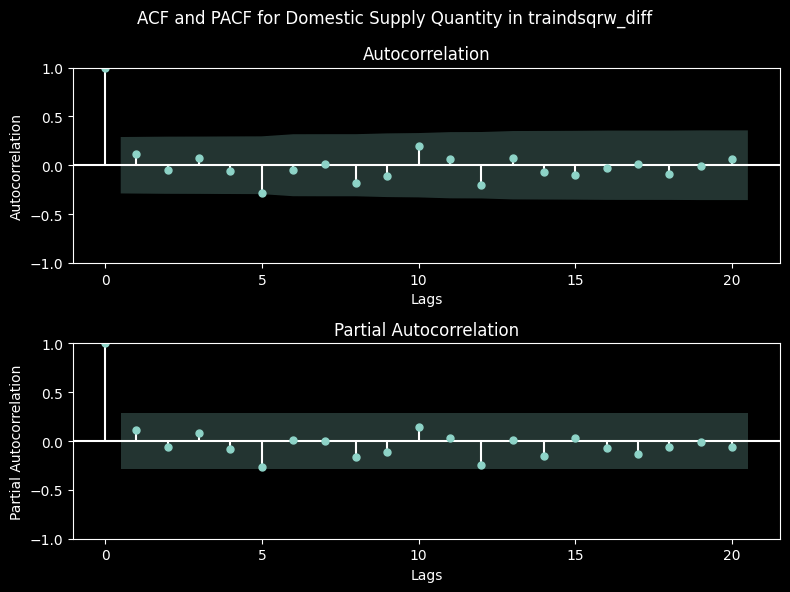

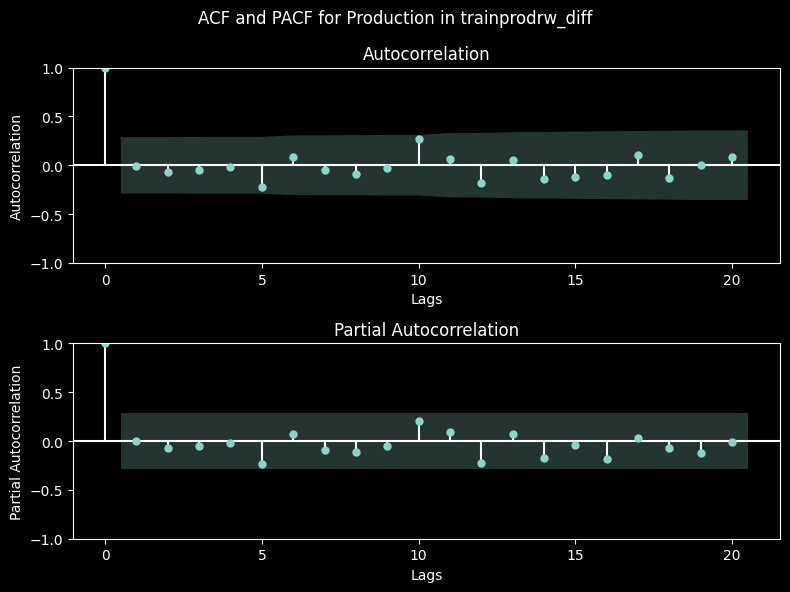

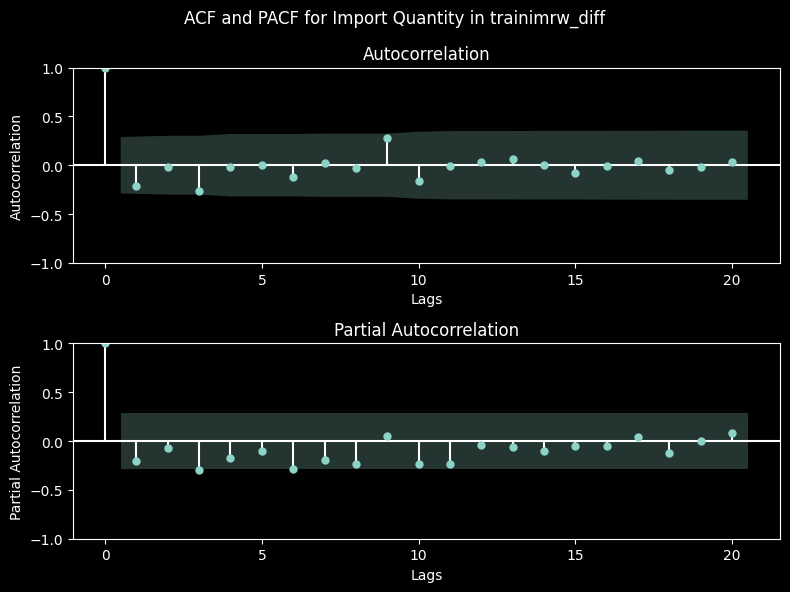

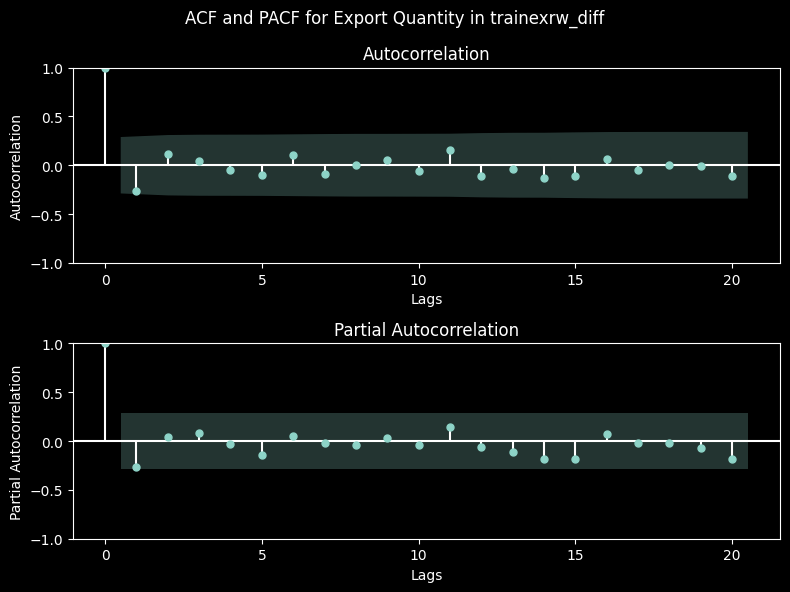

In [92]:
dataframe_names = ["traindsqrw_diff", "trainprodrw_diff", "trainimrw_diff", "trainexrw_diff"]
column_names =['Domestic Supply Quantity','Production','Import Quantity','Export Quantity']
plot_acf_pacf(dataframes_diff, dataframe_names,column_names)

The ACF plot shows the correlation between the quantity of domestic supply and its own lagged values. The PACF plot shows the correlation between the quantity of domestic supply and its own lagged values, after removing the effects of the intervening lags.

# MODELING

## Kenya

### Baseline model

**AutoRegressive (AR) model**

Predicts the future values of a variable based on its own past values. It assumes that the current value of the variable is a linear combination of its past values, with the weights determined by the autoregressive parameters.
While the AR model has its limitations and may not capture more complex patterns in the data, it serves as a good starting point for forecasting and provides a baseline against which other models can be compared

In [93]:
def calculate_rmse(train_data, test_data,n):
    rmse_dict = {}
    for col in train_data.columns:
        # select the column as the endogenous variable
        endog = train_data[col]

        # fit an AR model of order 1 to the time series
        model = AutoReg(endog, n)
        fitted_model = model.fit()

        # make predictions for the test set
        predictions = fitted_model.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

        # evaluate the model's performance on the test set
        mse = ((predictions - test_data[col]) ** 2).mean()
        rmse = np.sqrt(mse)
        rmse_dict[col] = rmse
        print("RMSE for {}: {}".format(col, rmse))

    return rmse_dict

Evaluation of AR

In [94]:
# Calculates the AR RMSE values for different elements
ar_RMSe_dict = {}
ar_RMSe_dict['traindsqKE_diff'] = calculate_rmse(traindsqKE_diff, testdsqKE, 1)
ar_RMSe_dict['trainprodKE_diff'] = calculate_rmse(trainprodKE_diff, testprodKE, 1)
ar_RMSe_dict['trainimKE_diff'] =calculate_rmse(trainimKE_diff, testimKE, 1)
ar_RMSe_dict['trainexKE_diff'] =calculate_rmse(trainexKE_diff, testexKE, 1)

ar_RMSe_dict = list(ar_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 30669.11440543961
RMSE for Production: 28791.91393996398
RMSE for Import Quantity: 4578.546406312445
RMSE for Export Quantity: 1219.280205643606


The high RMSE values for Domestic Supply Quantity and Production, along with the moderate RMSE for Import Quantity and Export Quantity, suggest that the AR model may not be performing well in capturing the underlying patterns and dynamics of the variables. These high RMSE values indicate a significant amount of error in the model's predictions compared to the actual values. Therefore, it may be necessary to explore other forecasting models

**AutoRegressive Integrated Moving Average (ARIMA) model**

A time series forecasting model that combines autoregressive (AR) and moving average (MA) components along with differencing to handle non-stationary data. By incorporating autoregressive, moving average, and differencing components, ARIMA models can capture both short-term and long-term patterns in the data

In [95]:
#Autoarima to determine best orders for Arima
def get_best_order(train_data, start_p=1, d=0, start_q=1,
                   max_p=10, max_d=0, max_q=13,
                   seasonal=True, stationary=False,
                   information_criterion='aic',
                   stepwise=False, suppress_warnings=True):
    # Instantiate an AutoARIMA model
    stepwise_model = auto_arima(train_data, start_p=start_p, d=d, start_q=start_q,
                                max_p=max_p, max_d=max_d, max_q=max_q,
                                seasonal=seasonal, stationary=stationary,
                                information_criterion=information_criterion,
                                stepwise=stepwise, suppress_warnings=suppress_warnings)
    
    # Fit the AutoARIMA model to the training data
    stepwise_model.fit(train_data)

    # Get the best order from the AutoARIMA model
    order = stepwise_model.order
    return order

In [96]:
print(get_best_order(traindsqKE))
print(get_best_order(trainprodKE))
print(get_best_order(trainexKE))
print(get_best_order(trainimKE))

(2, 0, 1)
(5, 0, 0)
(1, 0, 0)
(1, 0, 1)


In [97]:
#Arima

def calculate_rmse_arima(train_data, test_data, order=(1, 0, 1)):
    rmse_dict = {}

    for col in train_data.columns:
        # select the column as the endogenous variable
        endog = train_data[col]

        # fit an ARIMA model to the time series
        model = ARIMA(endog, order=order)
        fitted_model = model.fit()

        # make predictions for the test set
        predictions = fitted_model.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

        # evaluate the model's performance on the test set
        mse = ((predictions - test_data[col]) ** 2).mean()
        rmse = np.sqrt(mse)
        rmse_dict[col] = rmse
        print("RMSE for {}: {}".format(col, rmse))

    return rmse_dict

Evaluation of ARIMA

In [98]:
# Calculates ARIMA RMSE for each element
arima_RMSe_dict ={}

arima_RMSe_dict['traindsqKE_diff'] =  calculate_rmse_arima(traindsqKE,testdsqKE, order=((2, 0, 1)))
arima_RMSe_dict['trainprodKE_diff'] =  calculate_rmse_arima(trainprodKE,testprodKE, order=((5, 0, 0)))
arima_RMSe_dict['trainexKE_diff'] = calculate_rmse_arima(trainexKE,testexKE, order=((1, 0, 0)))
arima_RMSe_dict['trainimKE_diff'] = calculate_rmse_arima(trainimKE,testimKE, order=((1, 0, 1)))

arima_RMSe_dict = list(arima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 3231.4916040837015
RMSE for Production: 3356.1790624009845
RMSE for Export Quantity: 472.08395308950304
RMSE for Import Quantity: 2839.708293351278


The RMSE values for the ARIMA model indicate the average prediction error for each variable. Overall, the ARIMA model shows moderate to relatively low prediction errors, with higher errors for Domestic Supply Quantity and Production, and lower errors for Export Quantity and Import Quantity.

**Seasonal AutoRegressive Integrated Moving Average (SARIMA) model**

A forecasting model commonly used for time series data that exhibits both non-seasonal and seasonal patterns. it provides a more sophisticated and accurate approach to forecasting the multivariate time series data, taking into account both non-seasonal and seasonal components.

In [99]:
#Sarima
def calculate_rmse_sarima(train_data, test_data, order=(1, 0, 1), seasonal_order=(1, 0, 1, 12)):
    rmse_dict = {}

    for col in train_data.columns:
        # select the column as the endogenous variable
        endog = train_data[col]

        # fit a SARIMA model to the time series
        model = SARIMAX(endog, order=order, seasonal_order=seasonal_order)
        fitted_model = model.fit()

        # make predictions for the test set
        predictions = fitted_model.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

        # evaluate the model's performance on the test set
        mse = ((predictions - test_data[col]) ** 2).mean()
        rmse = np.sqrt(mse)
        rmse_dict[col] = rmse
        print("RMSE for {}: {}".format(col, rmse))

    return rmse_dict

Evaluation of SARIMA

In [100]:
# Calculate SARIMA RMSE for each element
sarima_RMSe_dict = {}
sarima_RMSe_dict['traindsqKE_diff'] = calculate_rmse_sarima(traindsqKE,testdsqKE, order=(2, 0, 1), seasonal_order=(2, 0, 1,7))
sarima_RMSe_dict['trainprodKE_diff'] = calculate_rmse_sarima(trainprodKE,testprodKE, order=(5, 0, 0), seasonal_order=(5, 0, 0,7))
sarima_RMSe_dict['trainexKE_diff']= calculate_rmse_sarima(trainexKE,testexKE, order=(1, 0, 0), seasonal_order=(1, 0, 0,7))
sarima_RMSe_dict['trainimKE_diff']= calculate_rmse_sarima(trainimKE,testimKE, order=(1, 0, 1), seasonal_order=(1, 0, 1,7))

sarima_RMSe_dict = list(sarima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 2423.366994369157
RMSE for Production: 2494.4917728043747
RMSE for Export Quantity: 351.5332175155674
RMSE for Import Quantity: 2702.8363910402277


The RMSE values for the SARIMA model indicate the average prediction error for each variable. The model performs relatively well, with lower errors for Export Quantity and Production, and slightly higher errors for Domestic Supply Quantity and Import Quantity. Overall, the SARIMA model demonstrates reasonably accurate predictions for the given data.

**Simple Exponential Smoothing**

It is a time series forecasting method that assigns exponentially decreasing weights to historical observations. It assumes that future values of a time series can be estimated as a weighted sum of past observations, with the weights decreasing exponentially as the observations become older

In [101]:
def calculate_rmse_simple_exponential_smoothing(train_data, test_data):
    rmse_dict = {}

    for col in train_data.columns:
        # select the column as the endogenous variable
        endog = train_data[col]

        # fit a simple exponential smoothing model to the time series
        model = SimpleExpSmoothing(endog)
        fitted_model = model.fit()

        # make predictions for the test set
        predictions = fitted_model.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

        # evaluate the model's performance on the test set
        mse = ((predictions - test_data[col]) ** 2).mean()
        rmse = np.sqrt(mse)
        rmse_dict[col] = rmse
        print("RMSE for {}: {}".format(col, rmse))

    return rmse_dict

Evaluating SES

In [102]:
# Calculating SES RMSE for each element
SES_rmse_dict = {}

SES_rmse_dict['traindsqKE_diff'] = calculate_rmse_simple_exponential_smoothing(traindsqKE_diff, testdsqKE)
SES_rmse_dict['trainprodKE_diff'] = calculate_rmse_simple_exponential_smoothing(trainprodKE_diff, testprodKE)
SES_rmse_dict['trainimKE_diff'] = calculate_rmse_simple_exponential_smoothing(trainimKE_diff, testimKE)
SES_rmse_dict['trainexKE_diff'] = calculate_rmse_simple_exponential_smoothing(trainexKE_diff, testexKE)

SES_rmse_dict = list(SES_rmse_dict.values())

RMSE for Domestic Supply Quantity: 30361.39511109155
RMSE for Production: 28822.450522225736
RMSE for Import Quantity: 4592.046401147623
RMSE for Export Quantity: 1204.7798279287003


The RMSE values for the Simple Exponential Smoothing (SES) model show the average prediction error for each variable. In this case, the RMSE values for Domestic Supply Quantity, Production, Import Quantity, and Export Quantity are relatively high. These high errors indicate that the SES model may not be suitable for accurately predicting these variables in the given data. It might be necessary to explore alternative models to improve the forecasting performance.

A function to get the best performing model

In [103]:
#get best performing model
def return_best_model(train_data, test_data, order=(1, 0, 1), seasonal_order=(1, 0, 1, 12)):
    rmse_dict = {}

    for col in train_data.columns:
        # select the column as the endogenous variable
        endog = train_data[col]

        # fit a SARIMA model to the time series
        model = SARIMAX(endog, order=order, seasonal_order=seasonal_order)
        fitted_model = model.fit()
    return fitted_model


In [104]:
# Applying the above function
dsq_model = return_best_model(traindsqKE,testdsqKE, order=(2, 0, 1), seasonal_order=(2, 0, 1,7))
prod_model = return_best_model(trainprodKE,testprodKE, order=(5, 0, 0), seasonal_order=(5, 0, 0,7))
ex_model = return_best_model(trainexKE,testexKE, order=(1, 0, 0), seasonal_order=(1, 0, 0,7))
im_model = return_best_model(trainimKE,testimKE, order=(1, 0, 1), seasonal_order=(1, 0, 1,7))

SARIMA is our best model since it has the lowest RMSE values for each element

In [105]:
sarima_RMSe_dict = {}
sarima_RMSe_dict['traindsqKE_diff'] = calculate_rmse_sarima(traindsqKE,testdsqKE, order=(2, 0, 1), seasonal_order=(2, 0, 1,7))
sarima_RMSe_dict['trainprodKE_diff'] = calculate_rmse_sarima(trainprodKE,testprodKE, order=(5, 0, 0), seasonal_order=(5, 0, 0,7))
sarima_RMSe_dict['trainexKE_diff']= calculate_rmse_sarima(trainexKE,testexKE, order=(1, 0, 0), seasonal_order=(1, 0, 0,7))
sarima_RMSe_dict['trainimKE_diff']= calculate_rmse_sarima(trainimKE,testimKE, order=(1, 0, 1), seasonal_order=(1, 0, 1,7))

sarima_RMSe_dict = list(sarima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 2423.366994369157
RMSE for Production: 2494.4917728043747
RMSE for Export Quantity: 351.5332175155674
RMSE for Import Quantity: 2702.8363910402277



## Tanzania Modeling

**AutoRegressive (AR) model**

The code calculates the RMSE for each of the differenced time series data (traindsqtz_diff, trainprodtz_diff, trainimtz_diff, trainextz_diff) using the `calculate_rmse() `function that has the AR model.

In [106]:
# Calculate AR RMSE values for each of the differenced time series data using the calculate_rmse() function
ar_RMSe_dict = {}
ar_RMSe_dict['traindsqtz_diff'] = calculate_rmse(traindsqtz_diff, testdsqtz, 1)
ar_RMSe_dict['trainprodtz_diff'] = calculate_rmse(trainprodtz_diff, testprodtz, 1)
ar_RMSe_dict['trainimtz_diff'] =calculate_rmse(trainimtz_diff, testimtz, 1)
ar_RMSe_dict['trainextz_diff'] =calculate_rmse(trainextz_diff, testextz, 1)

# Convert dictionary values to a list
ar_RMSe_dict = list(ar_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 40820.872742279564
RMSE for Production: 42906.3965612112
RMSE for Import Quantity: 1808.3297748385633
RMSE for Export Quantity: 1337.9559559844095


Higher RMSE values for Domestic Supply Quantity and Production suggest less accurate predictions, while lower RMSE values for Import Quantity and Export Quantity indicate relatively better predictions. Overall, the AR model may not be the best choice for accurately predicting Domestic Supply Quantity and Production variables, and alternative models should be explored.

**ARIMA**

In [107]:
# Get the best order using the pre-defined function of autoarima
print(get_best_order(traindsqtz))
print(get_best_order(trainprodtz))
print(get_best_order(trainextz))
print(get_best_order(trainimtz))

(3, 0, 0)
(2, 0, 2)
(3, 0, 0)
(4, 0, 0)


The code below calculates the RMSE for each of the differenced time series data (traindsqtz_diff, trainprodtz_diff, trainimtz_diff, trainextz_diff) using the `calculate_rmse_arima() `function that has the ARIMA model.

In [108]:
# Calculate ARIMA RMSE values for each of the differenced time series data using the calculate_rmse_arima() function
arima_RMSe_dict ={}

arima_RMSe_dict['traindsqtz_diff'] =  calculate_rmse_arima(traindsqtz,testdsqtz, order=((3, 0, 0)))
arima_RMSe_dict['trainprodtz_diff'] =  calculate_rmse_arima(trainprodtz,testprodtz, order=((2, 0, 2)))
arima_RMSe_dict['trainextz_diff'] = calculate_rmse_arima(trainextz,testextz, order=((3, 0, 0)))
arima_RMSe_dict['trainimtz_diff'] = calculate_rmse_arima(trainimtz,testimtz, order=((4, 0, 0)))

# Convert dictionary values to a list
arima_RMSe_dict = list(arima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 12572.377646367022
RMSE for Production: 12405.110350629415
RMSE for Export Quantity: 814.783212260446
RMSE for Import Quantity: 696.7912620792495


The lower RMSE values for Export Quantity and Import Quantity suggest that the model performs relatively well in predicting these variables. However, the higher RMSE values for Domestic Supply Quantity and Production indicate that the model may have difficulties accurately predicting these variables. Further analysis and exploration of alternative models may be necessary to improve the predictions for Domestic Supply Quantity and Production.

**SARIMA**

The code below calculates the RMSE for each of the differenced time series data (traindsqtz_diff, trainprodtz_diff, trainimtz_diff, trainextz_diff) using the `calculate_rmse_sarima() `function that has the SARIMA model.

In [109]:
# Calculate SARIMA RMSE values for each of the differenced time series data using the calculate_rmse_sarima() function
sarima_RMSe_dict = {}
sarima_RMSe_dict['traindsqtz_diff'] = calculate_rmse_sarima(traindsqtz,testdsqtz, order=(3, 0, 0), seasonal_order=(3, 0, 0,7))
sarima_RMSe_dict['trainprodtz_diff'] = calculate_rmse_sarima(trainprodtz,testprodtz, order=(2, 0, 2), seasonal_order=(2, 0, 2,9))
sarima_RMSe_dict['trainextz_diff']= calculate_rmse_sarima(trainextz,testextz, order=(3, 0, 0), seasonal_order=(3, 0, 0,9))
sarima_RMSe_dict['trainimtz_diff']= calculate_rmse_sarima(trainimtz,testimtz, order=(4, 0, 0), seasonal_order=(4, 0, 0,9))

sarima_RMSe_dict = list(sarima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 8826.549737306279
RMSE for Production: 9480.088552059306
RMSE for Export Quantity: 670.7472128201036
RMSE for Import Quantity: 507.6334925878919


The SARIMA model achieved relatively low RMSE values for all the variables, indicating good predictive performance. The lower RMSE values for Export Quantity and Import Quantity suggest that the model accurately captures the patterns and trends in these variables. Although the RMSE values for Domestic Supply Quantity and Production are slightly higher, they still indicate reasonably accurate predictions. Overall, the SARIMA model demonstrates effectiveness in forecasting the variables of interest making it our most suitable choice for future predictions in this context.

## Uganda Modeling

**AutoRegresive (AR) model**

In [110]:
# Calculate AR RMSE values for each of the differenced time series data using the calculate_rmse() function
ar_RMSe_dict = {}
ar_RMSe_dict['traindsqug_diff'] = calculate_rmse(traindsqug_diff, testdsqug, 1)
ar_RMSe_dict['trainprodug_diff'] = calculate_rmse(trainprodug_diff, testprodug, 1)
ar_RMSe_dict['trainimug_diff'] =calculate_rmse(trainimug_diff, testimug, 1)
ar_RMSe_dict['trainexug_diff'] =calculate_rmse(trainexug_diff, testexug, 1)

ar_RMSe_dict = list(ar_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 29359.850687986833
RMSE for Production: 28466.6712475477
RMSE for Import Quantity: 1468.7169061382747
RMSE for Export Quantity: 1390.1396598348679


The higher RMSE values suggest that the AR model may not capture the complex patterns and dynamics present in the data as effectively. Therefore, it may not be the most suitable model for forecasting the variables of interest in this context. Alternative models, such as SARIMA or exponential smoothing, may be worth considering for improved predictive performance.

In [111]:
print(get_best_order(traindsqug))
print(get_best_order(trainprodug))
print(get_best_order(trainexug))
print(get_best_order(trainimug))


(2, 0, 0)
(2, 0, 0)
(1, 0, 2)
(1, 0, 2)


In [112]:
# Calculate ARIMA RMSE values for each of the differenced time series data using the calculate_rmse_arima() function
arima_RMSe_dict ={}

arima_RMSe_dict['traindsqug_diff'] =  calculate_rmse_arima(traindsqug,testdsqug, order=((2, 0, 0)))
arima_RMSe_dict['trainprodug_diff'] =  calculate_rmse_arima(trainprodug,testprodug, order=((2, 0, 0)))
arima_RMSe_dict['trainexug_diff'] = calculate_rmse_arima(trainexug,testexug, order=((1, 0, 2)))
arima_RMSe_dict['trainimug_diff'] = calculate_rmse_arima(trainimug,testimug, order=((1, 0, 2)))

arima_RMSe_dict = list(arima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 9712.76080706728
RMSE for Production: 8829.569268989828
RMSE for Export Quantity: 782.6807590905614
RMSE for Import Quantity: 682.2888470072105


The ARIMA model for Uganda produced relatively lower RMSE values compared to the AR model, indicating improved accuracy in predicting the variables of interest. The lower RMSE values suggest that the ARIMA model captures the underlying patterns and dynamics in the data more effectively. The ARIMA model may be a suitable choice for forecasting the Domestic Supply Quantity, Production, Export Quantity, and Import Quantity in Uganda

In [113]:
# Calculate SARIMA RMSE values for each of the differenced time series data using the calculate_rmse_sarima() function
sarima_RMSe_dict = {}
sarima_RMSe_dict['traindsqug_diff'] = calculate_rmse_sarima(traindsqug,testdsqug, order=(2, 0, 1), seasonal_order=(2, 0, 1,4))
sarima_RMSe_dict['trainprodug_diff'] = calculate_rmse_sarima(trainprodug,testprodug, order=(5, 0, 0), seasonal_order=(5, 0, 0,6))
sarima_RMSe_dict['trainexug_diff']= calculate_rmse_sarima(trainexug,testexug, order=(1, 0, 0), seasonal_order=(1, 0, 0,7))
sarima_RMSe_dict['trainimug_diff']= calculate_rmse_sarima(trainimug,testimug, order=(1, 0, 1), seasonal_order=(1, 0, 1,7))

sarima_RMSe_dict = list(sarima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 15275.242715076532
RMSE for Production: 12026.724882317192
RMSE for Export Quantity: 956.086960661077
RMSE for Import Quantity: 442.091132192183


The SARIMA model for Uganda resulted in lower RMSE values compared to the AR and ARIMA models. This suggests that the SARIMA model provides improved accuracy in predicting the Domestic Supply Quantity, Production, Export Quantity, and Import Quantity. The lower RMSE values indicate that the SARIMA model captures the seasonality and other temporal patterns in the data more effectively. Therefore, the SARIMA model appears to be our most suitable choice for forecasting these variables in Uganda

## Rwanda Modeling

**AutoRegressive (AR) model**

In [114]:
# Calculate AR RMSE values for each of the differenced time series data using the calculate_rmse() function
ar_RMSe_dict = {}
ar_RMSe_dict['traindsqrw_diff'] = calculate_rmse(traindsqrw_diff, testdsqrw, 1)
ar_RMSe_dict['trainprodrw_diff'] = calculate_rmse(trainprodrw_diff, testprodrw, 1)
ar_RMSe_dict['trainimrw_diff'] =calculate_rmse(trainimrw_diff, testimrw, 1)
ar_RMSe_dict['trainexrw_diff'] =calculate_rmse(trainexrw_diff, testexrw, 1)

ar_RMSe_dict = list(ar_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 9063.855833136286
RMSE for Production: 8782.281095576003
RMSE for Import Quantity: 816.6799809301965
RMSE for Export Quantity: 227.48775428657356


The AR model for Rwanda shows relatively low RMSE values for Domestic Supply Quantity, Production, Import Quantity, and Export Quantity, indicating that it provides accurate predictions for these variables. The lower RMSE values suggest that the AR model captures the underlying patterns and trends in the data well

**ARIMA**

In [115]:
print(get_best_order(traindsqrw))
print(get_best_order(trainprodrw))
print(get_best_order(trainexrw))
print(get_best_order(trainimrw))


(2, 0, 0)
(1, 0, 0)
(2, 0, 0)
(1, 0, 0)


In [116]:
# Calculate ARIMA RMSE values for each of the differenced time series data using the calculate_rmse_arima() function
arima_RMSe_dict ={}

arima_RMSe_dict['traindsqrw_diff'] =  calculate_rmse_arima(traindsqrw,testdsqrw, order=((2, 0, 0)))
arima_RMSe_dict['trainprodrw_diff'] =  calculate_rmse_arima(trainprodrw,testprodrw, order=((1, 0, 0)))
arima_RMSe_dict['trainexrw_diff'] = calculate_rmse_arima(trainexrw,testexrw, order=((2, 0, 0)))
arima_RMSe_dict['trainimrw_diff'] = calculate_rmse_arima(trainimrw,testimrw, order=((1, 0, 0)))

arima_RMSe_dict = list(arima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 1854.0293620219331
RMSE for Production: 1557.1455277320008
RMSE for Export Quantity: 186.56058038974203
RMSE for Import Quantity: 732.8374297414277


The ARIMA model for Rwanda shows relatively low RMSE values for Domestic Supply Quantity, Production, Export Quantity, and Import Quantity, indicating that it provides accurate predictions for these variables. The lower RMSE values suggest that the ARIMA model captures the underlying patterns, seasonality, and trends in the data well
 the ARIMA model outperforms the AR model for forecasting the variables in Rwanda

**SARIMA**

In [117]:
# Calculate SARIMA RMSE values for each of the differenced time series data using the calculate_rmse_sarima() function
sarima_RMSe_dict = {}
sarima_RMSe_dict['traindsqrw_diff'] = calculate_rmse_sarima(traindsqrw,testdsqrw, order=(2, 0, 0), seasonal_order=(2, 0, 0,10))
sarima_RMSe_dict['trainprodrw_diff'] = calculate_rmse_sarima(trainprodrw,testprodrw, order=(1, 0, 0), seasonal_order=(1, 0, 0,10))
sarima_RMSe_dict['trainexrw_diff']= calculate_rmse_sarima(trainexrw,testexrw, order=(2, 0, 0), seasonal_order=(2, 0, 0,10))
sarima_RMSe_dict['trainimrw_diff']= calculate_rmse_sarima(trainimrw,testimrw, order=(1, 0, 0), seasonal_order=(1, 0, 0,9))

sarima_RMSe_dict = list(sarima_RMSe_dict.values())

RMSE for Domestic Supply Quantity: 1084.8848087032688
RMSE for Production: 1185.1161675993476
RMSE for Export Quantity: 172.46468947816163
RMSE for Import Quantity: 732.6615567991256


The SARIMA model shows relatively low RMSE values for Domestic Supply Quantity, Production, and Export Quantity, indicating good predictive accuracy. However, the RMSE value for Import Quantity is relatively higher, suggesting that the SARIMA model may not perform as well in forecasting import quantities compared to the other variables. Overall, the SARIMA model is effective in forecasting Domestic Supply Quantity, Production, and Export Quantity, but may not be as accurate for predicting Import Quantity in this case.

# FORECASTING

Forecasting the different elements' quantities for every country.

### Kenya

Kenya Forecasted values from 2005 to 2035:
            Domestic Supply Quantity  Export quantity  Import quantity  \
2005-12-31              27432.337627      1159.410809      1847.797383   
2006-12-31              27215.553898      1138.524596      1893.996790   
2007-12-31              27958.476674      1114.699130      2008.754621   
2008-12-31              29612.868267      1094.223622      2031.019025   
2009-12-31              30027.057350      1072.644623      2071.477334   
2010-12-31              30040.602753      1054.595643      2138.446762   
2011-12-31              30785.977959      1033.515191      2206.104775   
2012-12-31              30924.467761      1012.800588      1970.383127   
2013-12-31              30956.995911       992.522010      2003.437829   
2014-12-31              31113.816478       972.611329      2091.721943   
2015-12-31              31974.774070       953.132916      2105.578088   
2016-12-31              31993.281690       934.027592      2134.11637

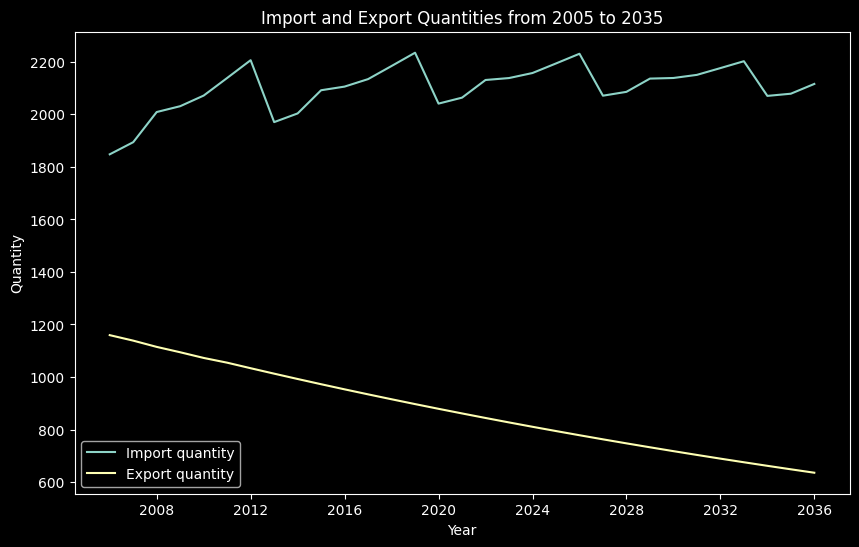

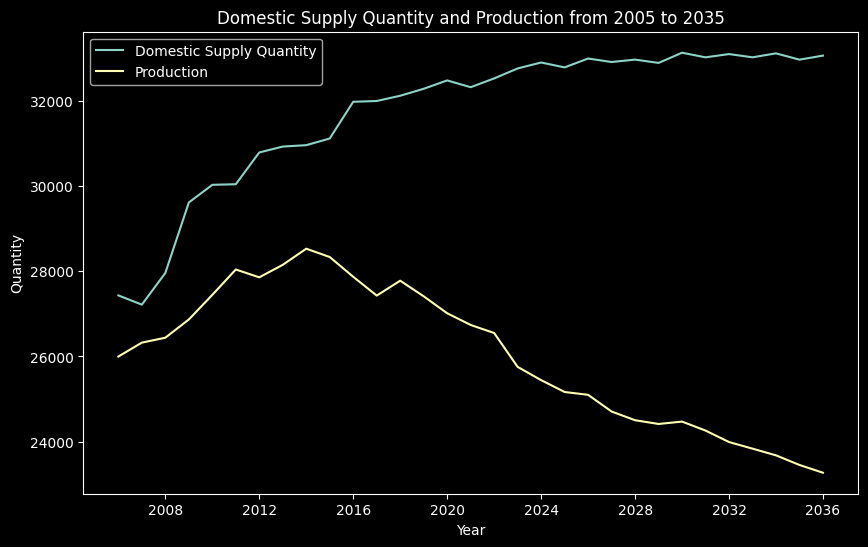

In [118]:
# Fit the SARIMA models
dsq_model = SARIMAX(traindsqKE, order=(2, 0, 1), seasonal_order=(2, 0, 1, 7))
dsq_model_fit = dsq_model.fit()

export_model = SARIMAX(trainexKE, order=(1, 0, 0), seasonal_order=(1, 0, 0, 7))
export_model_fit = export_model.fit()

import_model = SARIMAX(trainimKE, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7))
import_model_fit = import_model.fit()

prod_model = SARIMAX(trainprodKE, order=(5, 0, 0), seasonal_order=(5, 0, 0, 7))
prod_model_fit = prod_model.fit()

# Prompt the user to enter the start year and end year
start_year = int(input("Enter the start year: "))
end_year = int(input("Enter the end year: "))

# Create an empty DataFrame to store the forecasts
Kenya_forecast_df = pd.DataFrame()

# Forecast future values
dsq_forecast = dsq_model_fit.forecast(steps=end_year - start_year + 1)
export_forecast = export_model_fit.forecast(steps=end_year - start_year + 1)
import_forecast = import_model_fit.forecast(steps=end_year - start_year + 1)
prod_forecast = prod_model_fit.forecast(steps=end_year - start_year + 1)

# Store the forecasted values in the DataFrame
Kenya_forecast_df["Domestic Supply Quantity"] = dsq_forecast
Kenya_forecast_df["Export quantity"] = export_forecast
Kenya_forecast_df["Import quantity"] = import_forecast
Kenya_forecast_df["Production"] = prod_forecast

# Set the index of the DataFrame to be the forecasted dates
Kenya_forecast_df.index = pd.date_range(start=f'{start_year}-12-31', periods=end_year - start_year + 1, freq='Y')

# Display the forecasted values
print(f"Kenya Forecasted values from {start_year} to {end_year}:")
print(Kenya_forecast_df)

# Plot Import and Export quantities together
plt.figure(figsize=(10, 6))
plt.plot(Kenya_forecast_df.index, Kenya_forecast_df['Import quantity'], label='Import quantity')
plt.plot(Kenya_forecast_df.index, Kenya_forecast_df['Export quantity'], label='Export quantity')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Import and Export Quantities from {start_year} to {end_year}")
plt.legend()
plt.show()

# Plot Domestic Supply Quantity and Production quantities together
plt.figure(figsize=(10, 6))
plt.plot(Kenya_forecast_df.index, Kenya_forecast_df["Domestic Supply Quantity"], label='Domestic Supply Quantity')
plt.plot(Kenya_forecast_df.index, Kenya_forecast_df['Production'], label='Production')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Domestic Supply Quantity and Production from {start_year} to {end_year}")
plt.legend()
plt.show()


### Tanzania

Tanzania Forecasted values from 2005 to 2035:
            Domestic Supply Quantity  Export quantity  Import quantity  \
2005-12-31              32868.872643       712.564279      1566.109594   
2006-12-31              31576.398046       793.220449      1548.341360   
2007-12-31              33511.955625       803.336816      1252.014460   
2008-12-31              33557.033092       831.609737      1529.492558   
2009-12-31              35013.315141       759.200348      1438.179469   
2010-12-31              35224.192382       702.860157      1314.844280   
2011-12-31              34468.734411       714.687812      1552.067701   
2012-12-31              33901.582113       787.664406      1590.845461   
2013-12-31              34038.208267       694.038752      1360.907310   
2014-12-31              33110.980414       718.764734      1532.432267   
2015-12-31              32807.473442       743.390425      1476.681080   
2016-12-31              32089.773212       747.442425      1386.84

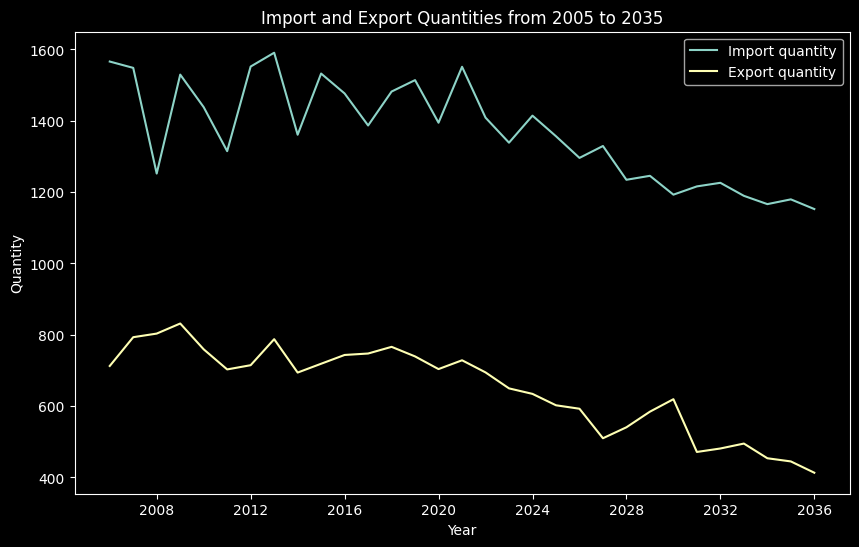

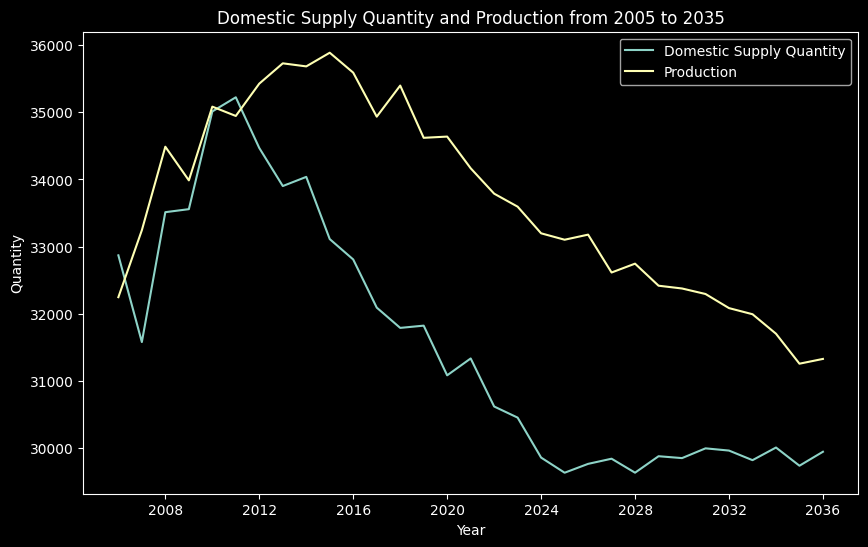

In [119]:
# Fit the SARIMA models
dsq_model = SARIMAX(traindsqtz, order=(3, 0, 0), seasonal_order=(3, 0, 0,7))
dsq_model_fit = dsq_model.fit()

export_model = SARIMAX(trainextz, order=(3, 0, 0), seasonal_order=(3, 0, 0,9))
export_model_fit = export_model.fit()

import_model = SARIMAX(trainimtz, order=(4, 0, 0), seasonal_order=(4, 0, 0,9))
import_model_fit = import_model.fit()

prod_model = SARIMAX(trainprodtz, order=(2, 0, 2), seasonal_order=(2, 0, 2,9))
prod_model_fit = prod_model.fit()

# Prompt the user to enter the start year and end year
start_year = int(input("Enter the start year: "))
end_year = int(input("Enter the end year: "))

# Create an empty DataFrame to store the forecasts
Tanzania_forecast_df = pd.DataFrame()

# Forecast future values
dsq_forecast = dsq_model_fit.forecast(steps=end_year - start_year + 1)
export_forecast = export_model_fit.forecast(steps=end_year - start_year + 1)
import_forecast = import_model_fit.forecast(steps=end_year - start_year + 1)
prod_forecast = prod_model_fit.forecast(steps=end_year - start_year + 1)

# Store the forecasted values in the DataFrame
Tanzania_forecast_df["Domestic Supply Quantity"] = dsq_forecast
Tanzania_forecast_df["Export quantity"] = export_forecast
Tanzania_forecast_df["Import quantity"] = import_forecast
Tanzania_forecast_df["Production"] = prod_forecast

# Set the index of the DataFrame to be the forecasted dates
Tanzania_forecast_df.index = pd.date_range(start=f'{start_year}-12-31', periods=end_year - start_year + 1, freq='Y')

# Display the forecasted values
print(f"Tanzania Forecasted values from {start_year} to {end_year}:")
print(Tanzania_forecast_df)

# Plot Import and Export quantities together
plt.figure(figsize=(10, 6))
plt.plot(Tanzania_forecast_df.index, Tanzania_forecast_df['Import quantity'], label='Import quantity')
plt.plot(Tanzania_forecast_df.index, Tanzania_forecast_df['Export quantity'], label='Export quantity')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Import and Export Quantities from {start_year} to {end_year}")
plt.legend()
plt.show()

# Plot Domestic Supply Quantity and Production quantities together
plt.figure(figsize=(10, 6))
plt.plot(Tanzania_forecast_df.index, Tanzania_forecast_df["Domestic Supply Quantity"], label='Domestic Supply Quantity')
plt.plot(Tanzania_forecast_df.index, Tanzania_forecast_df['Production'], label='Production')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Domestic Supply Quantity and Production from {start_year} to {end_year}")
plt.legend()
plt.show()

### Uganda

Uganda Forecasted values from 2005 to 2035:
            Domestic Supply Quantity  Export quantity  Import quantity  \
2005-12-31              19958.873397       662.042617      1081.983505   
2006-12-31              17999.868395       788.697287      1106.314123   
2007-12-31              16925.009628       603.159193      1149.841513   
2008-12-31              15698.740095       582.429081      1167.239827   
2009-12-31              14992.530298       569.380212      1193.912882   
2010-12-31              14540.084266       415.009036      1191.943418   
2011-12-31              14299.786811       392.952471      1209.815575   
2012-12-31              12468.148430       452.276620      1189.817364   
2013-12-31              11599.545419       368.732247      1169.489673   
2014-12-31              11054.400388       478.072285      1144.607730   
2015-12-31              10718.371366       485.637503      1126.258717   
2016-12-31               9733.345574       488.490048      1105.7799

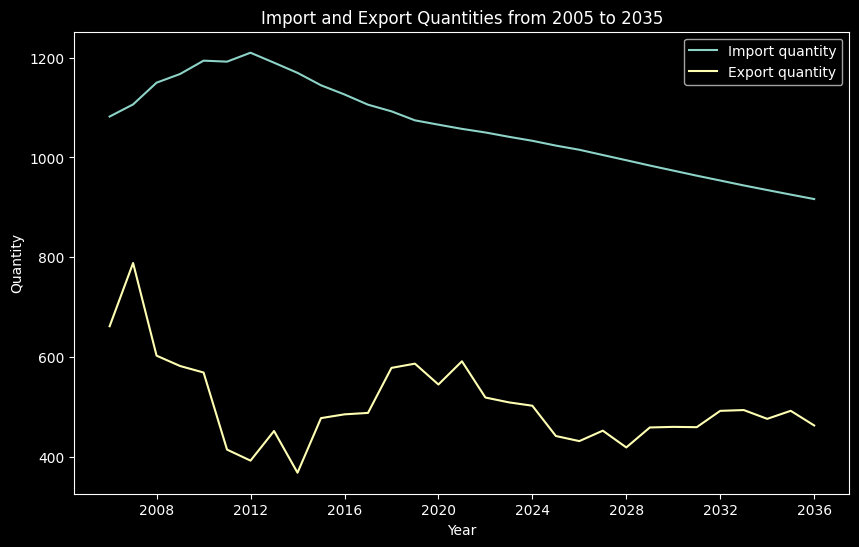

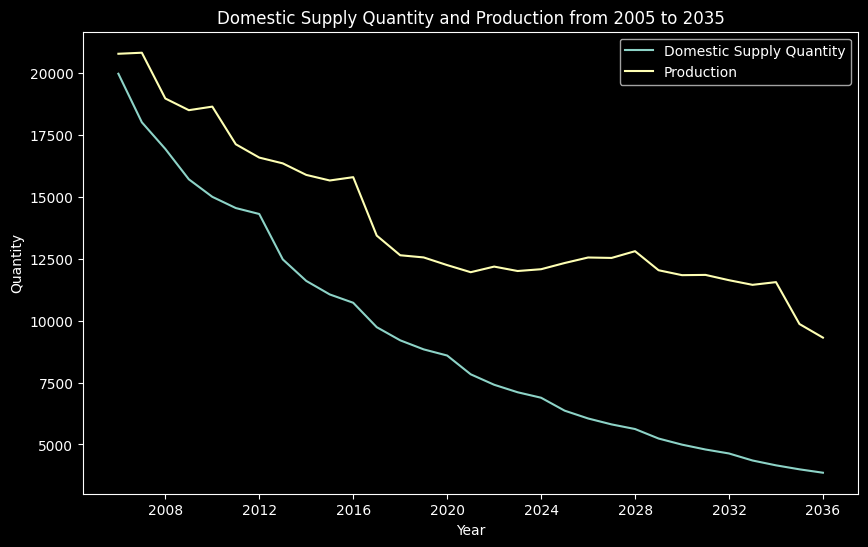

In [120]:

# Fit the SARIMA models
dsq_model = SARIMAX(traindsqug, order=(2, 0, 1), seasonal_order=(2, 0, 1,4))
dsq_model_fit = dsq_model.fit()

export_model = SARIMAX(trainexug, order=(1, 0, 0), seasonal_order=(1, 0, 0,7))
export_model_fit = export_model.fit()

import_model = SARIMAX(trainimug, order=(1, 0, 1), seasonal_order=(1, 0, 1,7))
import_model_fit = import_model.fit()

prod_model = SARIMAX(trainprodug, order=(5, 0, 0), seasonal_order=(5, 0, 0,6))
prod_model_fit = prod_model.fit()

# Prompt the user to enter the start year and end year
start_year = int(input("Enter the start year: "))
end_year = int(input("Enter the end year: "))

# Create an empty DataFrame to store the forecasts
Uganda_forecast_df = pd.DataFrame()

# Forecast future values
dsq_forecast = dsq_model_fit.forecast(steps=end_year - start_year + 1)
export_forecast = export_model_fit.forecast(steps=end_year - start_year + 1)
import_forecast = import_model_fit.forecast(steps=end_year - start_year + 1)
prod_forecast = prod_model_fit.forecast(steps=end_year - start_year + 1)

# Store the forecasted values in the DataFrame
Uganda_forecast_df["Domestic Supply Quantity"] = dsq_forecast
Uganda_forecast_df["Export quantity"] = export_forecast
Uganda_forecast_df["Import quantity"] = import_forecast
Uganda_forecast_df["Production"] = prod_forecast

# Set the index of the DataFrame to be the forecasted dates
Uganda_forecast_df.index = pd.date_range(start=f'{start_year}-12-31', periods=end_year - start_year + 1, freq='Y')

# Display the forecasted values
print(f"Uganda Forecasted values from {start_year} to {end_year}:")
print(Uganda_forecast_df)

# Plot Import and Export quantities together
plt.figure(figsize=(10, 6))
plt.plot(Uganda_forecast_df.index, Uganda_forecast_df['Import quantity'], label='Import quantity')
plt.plot(Uganda_forecast_df.index, Uganda_forecast_df['Export quantity'], label='Export quantity')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Import and Export Quantities from {start_year} to {end_year}")
plt.legend()
plt.show()

# Plot Domestic Supply Quantity and Production quantities together
plt.figure(figsize=(10, 6))
plt.plot(Uganda_forecast_df.index, Uganda_forecast_df["Domestic Supply Quantity"], label='Domestic Supply Quantity')
plt.plot(Uganda_forecast_df.index, Uganda_forecast_df['Production'], label='Production')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Domestic Supply Quantity and Production from {start_year} to {end_year}")
plt.legend()
plt.show()

### Rwanda

Rwanda Forecasted values from 2005 to 2035:
            Domestic Supply Quantity  Export quantity  Import quantity  \
2005-12-31               8089.405999        67.493057       151.850904   
2006-12-31               8132.914619        68.169948       140.832931   
2007-12-31               8211.194255        67.441222       129.616815   
2008-12-31               8470.028581        67.828830       111.907474   
2009-12-31               8173.727271        68.075649       111.600761   
2010-12-31               8056.034737        75.220746        99.085915   
2011-12-31               8109.666346        72.953827       109.809786   
2012-12-31               8112.938658        73.030037       113.905439   
2013-12-31               8112.896029        67.633628        88.876535   
2014-12-31               8202.260957        68.183568        81.121504   
2015-12-31               8273.316232        64.691025        73.383382   
2016-12-31               8292.842360        64.753642        66.1338

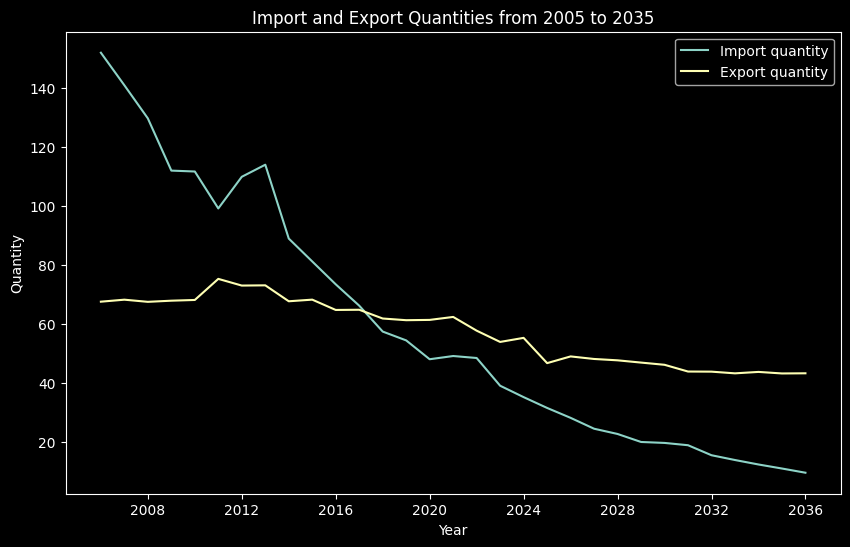

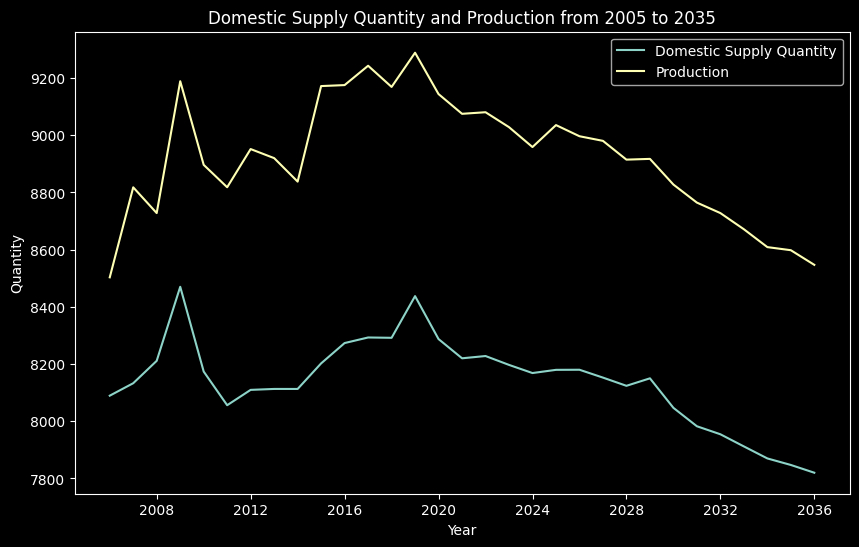

In [121]:

# Fit the SARIMA models
dsq_model = SARIMAX(traindsqrw, order=(2, 0, 0), seasonal_order=(2, 0, 0,10))
dsq_model_fit = dsq_model.fit()

export_model = SARIMAX(trainexrw, order=(2, 0, 0), seasonal_order=(2, 0, 0,10))
export_model_fit = export_model.fit()

import_model = SARIMAX(trainimrw, order=(1, 0, 0), seasonal_order=(1, 0, 0,9))
import_model_fit = import_model.fit()

prod_model = SARIMAX(trainprodrw, order=(1, 0, 0), seasonal_order=(1, 0, 0,10))
prod_model_fit = prod_model.fit()

# Prompt the user to enter the start year and end year
start_year = int(input("Enter the start year: "))
end_year = int(input("Enter the end year: "))

# Create an empty DataFrame to store the forecasts
rwanda_forecast_df = pd.DataFrame()

# Forecast future values
dsq_forecast = dsq_model_fit.forecast(steps=end_year - start_year + 1)
export_forecast = export_model_fit.forecast(steps=end_year - start_year + 1)
import_forecast = import_model_fit.forecast(steps=end_year - start_year + 1)
prod_forecast = prod_model_fit.forecast(steps=end_year - start_year + 1)

# Store the forecasted values in the DataFrame
rwanda_forecast_df["Domestic Supply Quantity"] = dsq_forecast
rwanda_forecast_df["Export quantity"] = export_forecast
rwanda_forecast_df["Import quantity"] = import_forecast
rwanda_forecast_df["Production"] = prod_forecast

# Set the index of the DataFrame to be the forecasted dates
rwanda_forecast_df.index = pd.date_range(start=f'{start_year}-12-31', periods=end_year - start_year + 1, freq='Y')

# Display the forecasted values
print(f"Rwanda Forecasted values from {start_year} to {end_year}:")
print(rwanda_forecast_df)

# Plot Import and Export quantities together
plt.figure(figsize=(10, 6))
plt.plot(rwanda_forecast_df.index, rwanda_forecast_df['Import quantity'], label='Import quantity')
plt.plot(rwanda_forecast_df.index, rwanda_forecast_df['Export quantity'], label='Export quantity')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Import and Export Quantities from {start_year} to {end_year}")
plt.legend()
plt.show()

# Plot Domestic Supply Quantity and Production quantities together
plt.figure(figsize=(10, 6))
plt.plot(rwanda_forecast_df.index, rwanda_forecast_df["Domestic Supply Quantity"], label='Domestic Supply Quantity')
plt.plot(rwanda_forecast_df.index, rwanda_forecast_df['Production'], label='Production')
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.title(f"Domestic Supply Quantity and Production from {start_year} to {end_year}")
plt.legend()
plt.show()


# PICKLING

**Kenya**

In [122]:
import pickle

# Pickle the DataFrame
with open('Kenya_forecast.pkl', 'wb') as f:
    pickle.dump(Kenya_forecast_df, f)

**Tanzania**

In [123]:
# Pickle the DataFrame
with open('Tanzania_forecast.pkl', 'wb') as f:
    pickle.dump(Tanzania_forecast_df, f)

**Uganda**

In [126]:
# Pickle the DataFrame
with open('Uganda_forecast.pkl', 'wb') as f:
    pickle.dump(Uganda_forecast_df, f)

**Rwanda**

In [125]:
# Pickle the DataFrame
with open('rwanda_forecast.pkl', 'wb') as f:
    pickle.dump(rwanda_forecast_df, f)

## Conclusions

- After analyzing a visualization of the top 10 items produced by East African countries, we can observe distinct production patterns. Cassava and products emerges as the dominant product, closely followed by Bananas. Conversely, potatoes and associated products exhibit the lowest production levels among the selected items.
- Generally the amount of imports in the Eastern African countries is higher than the exports .
For the domestic supply quantity the trends and growth patterns for Tanzania, Uganda, Kenya, and Rwanda exhibits unique patterns, the observations suggest enhanced agricultural productivity and improved food availability within the respective nations. However, fluctuations and variations indicate that there may still be challenges to address in achieving consistent and sustained food growth and security
- In conclusion the SARIMA model shows relatively low RMSE values for Domestic Supply Quantity, Production, and Export Quantity, indicating good predictive accuracy. Overally, the SARIMA model is effective in forecasting Domestic Supply Quantity, Production, and Export Quantity.acy. Overally, the SARIMA model is effective in forecasting Domestic Supply Quantity, Production, and Export Quantity.









 ## Recommendations

## Kenya 


- Since production levels of food will decrease over the coming years the government should deliberate on ways to maintain the domestic food supply either by increasing imports , reducing exports or boosting production of food


## Tanzania 


- Increase domestic production: Encourage and support domestic industries to ramp up their production levels. This can be achieved through incentives such as tax breaks, subsidies, and grants. Investments in research and development can also be made to enhance productivity and efficiency.
- Support agriculture and food production: Enhance support for the agricultural sector to increase food production. This can include providing subsidies, improving access to credit and technology, and implementing effective irrigation systems. Promote sustainable farming practices and invest in agricultural research and development to enhance productivity and reduce post-harvest losses.

## Uganda 

-  Stockpile essential goods: Establish strategic reserves or stockpiles of essential goods to ensure a buffer against supply disruptions. This can include critical commodities like food staples.Careful management of stockpiles is essential to avoid waste and expiration of goods.
- Increase on imports to meet food demands
- Decrease exports to meet the population needs rather than international market


## Rwanda

- Increase imports to meet the population's food demand
- Encourage Food production to lessen dependency on imports 